In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_percentage_error
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
import matplotlib.pyplot as plt
import tensorflow as tf
import seaborn as sns
import random
from tensorflow.keras.optimizers import Adam

# Import Data

In [2]:
seed = 42
np.random.seed(seed)
tf.random.set_seed(seed)
random.seed(seed)

In [3]:
data = pd.read_csv('https://raw.githubusercontent.com/Mluthfialgifari/Tugas-Akhir-Skripsi/refs/heads/main/Revisi%20Analisis/Data%20TMA%20(Jan%202022%20-%20Juni%202025).csv')
data = data.loc[:, ['Daily_Period','TMA_Daily']]
data = data.iloc[:1215].reset_index(drop=True)

print(data.head())
print(data.tail())
print(data.shape)

  Daily_Period  TMA_Daily
0   01/01/2022       10.0
1   02/01/2022       10.0
2   03/01/2022       10.0
3   04/01/2022       10.0
4   05/01/2022       12.5
     Daily_Period  TMA_Daily
1210   25/04/2025  20.000000
1211   26/04/2025  20.000000
1212   27/04/2025  20.000000
1213   28/04/2025  21.666667
1214   29/04/2025  20.000000
(1215, 2)


# Eksplorasi Data

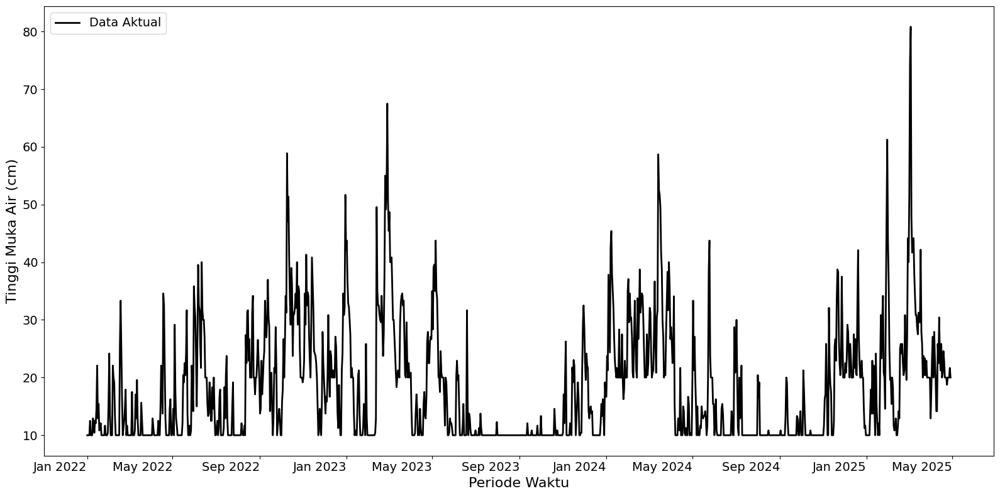

Dimension of full data: (1215, 2)


In [4]:
import matplotlib.pyplot as plt
from matplotlib.dates import MonthLocator, DateFormatter
import pandas as pd

# Pastikan kolom waktu dalam format datetime
data['Daily_Period'] = pd.to_datetime(data['Daily_Period'], format='%d/%m/%Y')

# Membuat plot seluruh data tanpa split
plt.figure(figsize=(16, 8))
plt.plot(data['Daily_Period'], data['TMA_Daily'], lw=2, color='black', label='Data Aktual')

# Label dan format
plt.xlabel('Periode Waktu', fontsize=16)
plt.ylabel('Tinggi Muka Air (cm)', fontsize=16)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Set axis locator dan format tanggal
plt.gca().xaxis.set_major_locator(MonthLocator(bymonth=[1, 5, 9]))
plt.gca().xaxis.set_major_formatter(DateFormatter('%b %Y'))

# Format rotasi tanggal
plt.gcf().autofmt_xdate(rotation=0)

# Tambahkan legend
plt.legend(fontsize=14)
# plt.title('Plot Seluruh Data Time Series TMA', fontsize=18)

plt.tight_layout()
plt.show()

# Print dimensi total
print('Dimension of full data:', data.shape)

# Normalisasi Data

Proses normalisasi data dilakukan menggunakan metode min-max normalization hingga menghasilkan data yang berskala [0,1].

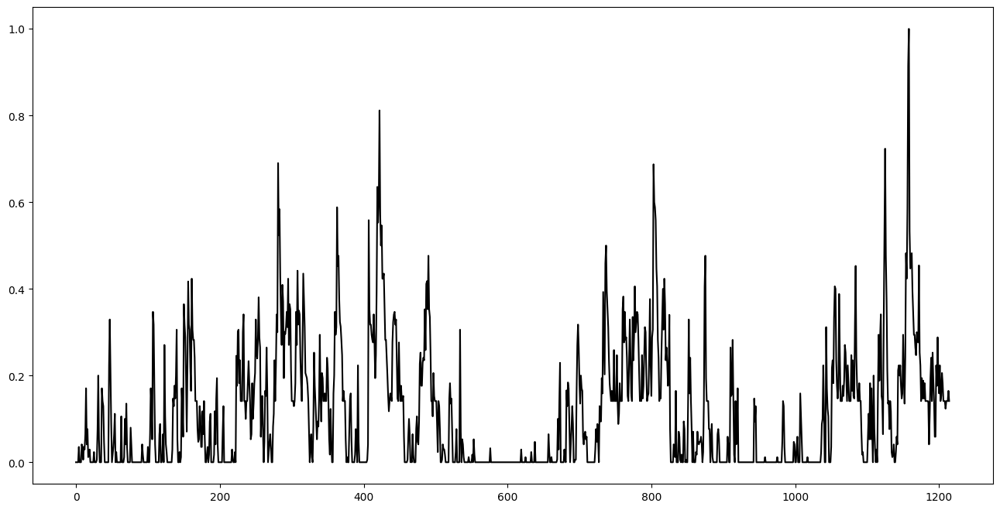

In [5]:
# Step 1: Normalize the data using Min-Max scaling
scaler = MinMaxScaler()
data['TMA_normalized'] = scaler.fit_transform(data['TMA_Daily'].values.reshape(-1, 1))
plt.figure(figsize=(16, 8))
plt.plot(data['TMA_normalized'], color='black')

In [6]:
print(data['TMA_normalized'].head())
print(data['TMA_normalized'].tail())

0    0.000000
1    0.000000
2    0.000000
3    0.000000
4    0.035294
Name: TMA_normalized, dtype: float64
1210    0.141176
1211    0.141176
1212    0.141176
1213    0.164706
1214    0.141176
Name: TMA_normalized, dtype: float64


# Hyperparameter Tuning & Cross Validation

Hyperparameter tuning dilakukan untuk menentukan hyperparameter terbaik melalui langkah validasi berupa *time series k-fold cross validation*. Banyaknya fold yang digunakan dalam langkah validasi adalah sebanyak k = 5 fold.

In [7]:
data_series = data['TMA_normalized'].values
data_series = data_series.reshape((len(data_series), 1))
data_series

array([[0.        ],
       [0.        ],
       [0.        ],
       ...,
       [0.14117647],
       [0.16470588],
       [0.14117647]])

In [8]:
from tensorflow.keras.initializers import HeUniform, GlorotUniform

def create_model(neurons, learning_rate, init_scheme='he_uniform'):
    seed = 42
    np.random.seed(seed)
    tf.random.set_seed(seed)
    random.seed(seed)

    # Pilih initializer berdasarkan parameter
    if init_scheme == 'he_uniform':
        initializer = HeUniform()
    elif init_scheme == 'glorot_uniform':
        initializer = GlorotUniform()
    else:
        raise ValueError("init_scheme harus 'he_uniform' atau 'glorot_uniform'")

    model = Sequential()
    model.add(LSTM(
        neurons,
        activation='tanh',
        input_shape=(30, 1),
        return_sequences=True,
        kernel_initializer=initializer,
        recurrent_initializer=initializer,
        bias_initializer='zeros'
    ))
    model.add(LSTM(
        16,
        activation='tanh',
        kernel_initializer=initializer,
        recurrent_initializer=initializer,
        bias_initializer='zeros'
    ))
    model.add(Dropout(0.01))
    model.add(Dense(1, kernel_initializer=initializer, bias_initializer='zeros'))

    optimizer = Adam(learning_rate=learning_rate)
    model.compile(loss='mean_squared_error', optimizer=optimizer)
    return model

In [9]:
import keras

class EarlyStoppingAtMinLoss(keras.callbacks.Callback):
    """Stop training when the loss is at its min, i.e. the loss stops decreasing.

    Arguments:
        patience: Number of epochs to wait after min has been hit. After this
        number of no improvement, training stops.
    """

    def __init__(self, patience=0):
        super().__init__()
        self.patience = patience
        # best_weights to store the weights at which the minimum loss occurs.
        self.best_weights = None

    def on_train_begin(self, logs=None):
        # The number of epoch it has waited when loss is no longer minimum.
        self.wait = 0
        # The epoch the training stops at.
        self.stopped_epoch = 0
        # Initialize the best as infinity.
        self.best = np.inf

    def on_epoch_end(self, epoch, logs=None):
        current = logs.get("val_loss")
        if np.less(current, self.best):
            self.best = current
            self.wait = 0
            # print('abcd')
            # Record the best weights if current results is better (less).
            self.best_weights = self.model.get_weights()
        else:
            self.wait += 1
            if self.wait >= self.patience:
                self.stopped_epoch = epoch
                self.model.stop_training = True
                print("Restoring model weights from the end of the best epoch.")
                self.model.set_weights(self.best_weights)

    def on_train_end(self, logs=None):
        if self.stopped_epoch > 0:
            print("Epoch %05d: early stopping" % (self.stopped_epoch + 1))

## Sliding Window Cross Validation

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - loss: 0.0517 - val_loss: 0.0213
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0062 - val_loss: 0.0330
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0052 - val_loss: 0.0353
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0104 - val_loss: 0.0561
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0081 - val_loss: 0.0254
Epoch 6/150
90/93 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0060Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0060 - val_loss: 0.0380
Epoch 00006: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
mape validation = 40.84465652408074 %
mape test = 32.385787167938574 %


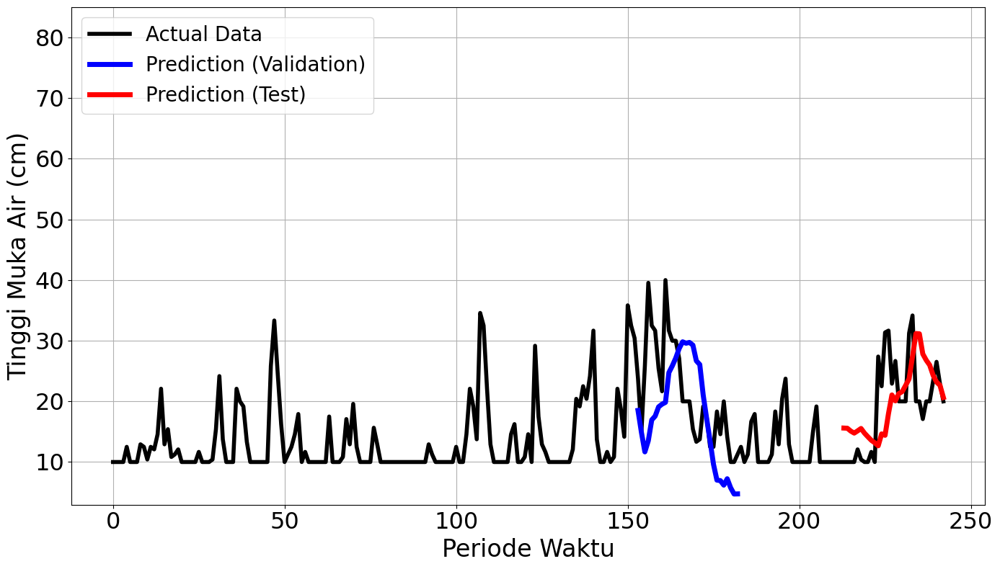

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0581 - val_loss: 0.1359
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0304 - val_loss: 0.0315
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0154 - val_loss: 0.0367
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0100 - val_loss: 0.0388
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0136 - val_loss: 0.0523
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0094 - val_loss: 0.0466
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0103 - val_loss: 0.0296
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0092 - val_loss: 0.0443
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0126 - val_loss: 0.0424
Epoch 10/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0119 - val_loss: 0.0528
Epoch 11/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0122 - val_loss: 0.0550
Epoch 12/150
88/93 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0116Restori

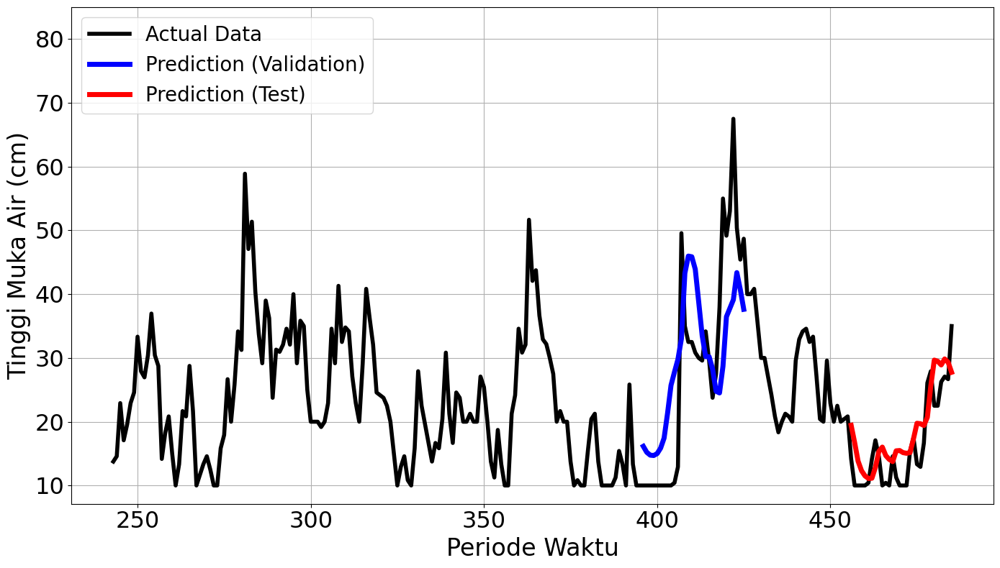

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - loss: 0.0331 - val_loss: 3.6417e-04
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0144 - val_loss: 0.0019
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0058 - val_loss: 1.5957e-04
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0027 - val_loss: 0.0017
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0087 - val_loss: 3.1833e-04
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0014 - val_loss: 1.8584e-04
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0025 - val_loss: 1.6375e-04
Epoch 8/150
89/93 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0046Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0046 - val_loss: 2.6795e-04
Epoch 00008: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
mape validation = 4.068506219918473 %
mape test = 26.928829071319104 %


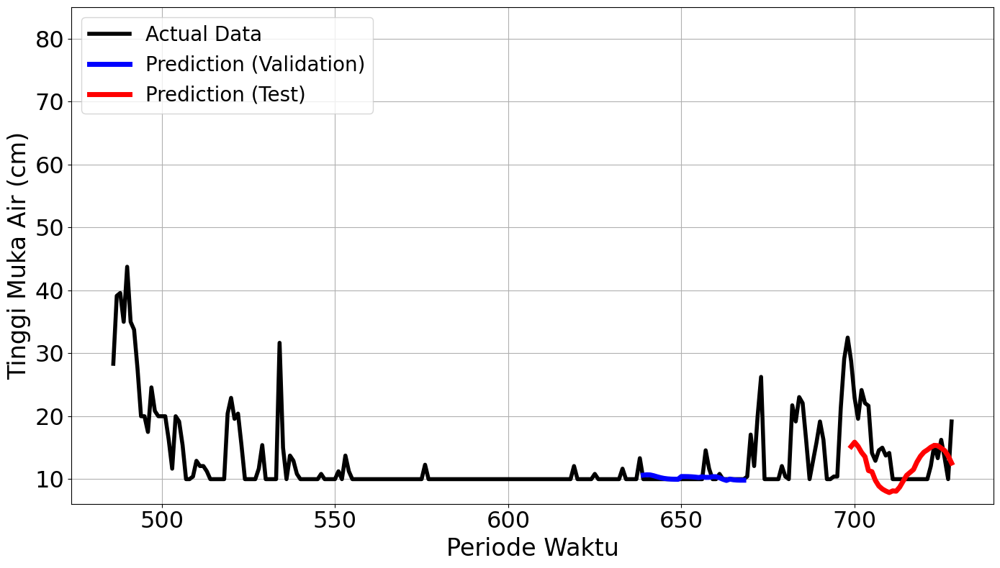

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0644 - val_loss: 0.0441
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0179 - val_loss: 0.0120
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0180 - val_loss: 0.0251
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0155 - val_loss: 0.0206
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0109 - val_loss: 0.0210
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0103 - val_loss: 0.0138
Epoch 7/150
88/93 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0117Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0117 - val_loss: 0.0154
Epoch 00007: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
mape validation = 56.1974817593516 %
mape test = 129.7325798193851 %


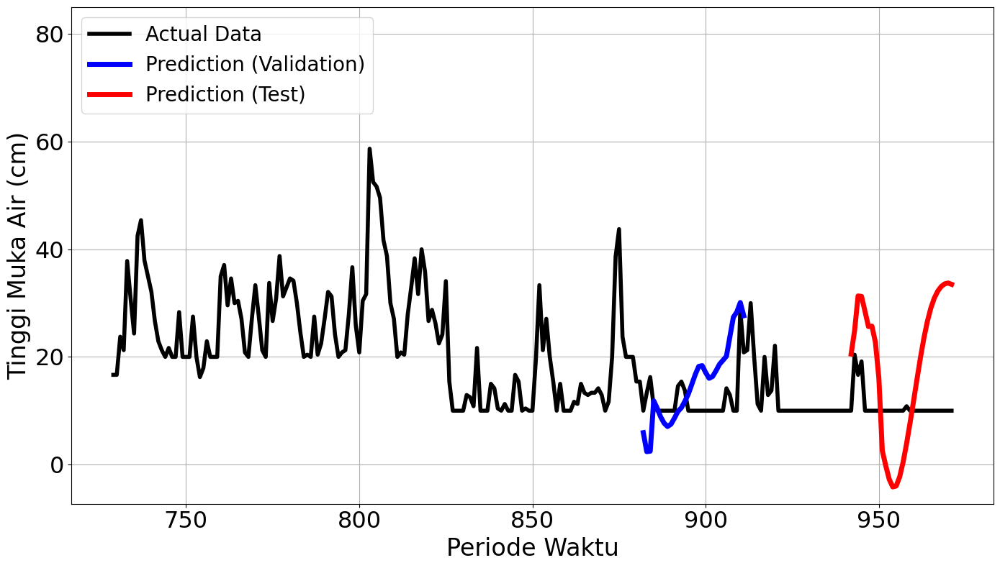

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0420 - val_loss: 0.0425
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0102 - val_loss: 0.0388
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0070 - val_loss: 0.0302
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0106 - val_loss: 0.0375
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0077 - val_loss: 0.0344
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0060 - val_loss: 0.0441
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0063 - val_loss: 0.0403
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0067 - val_loss: 0.0230
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0049 - val_loss: 0.0374
Epoch 10/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0081 - val_loss: 0.0275
Epoch 11/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0086 - val_loss: 0.0232
Epoch 12/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0072 - val

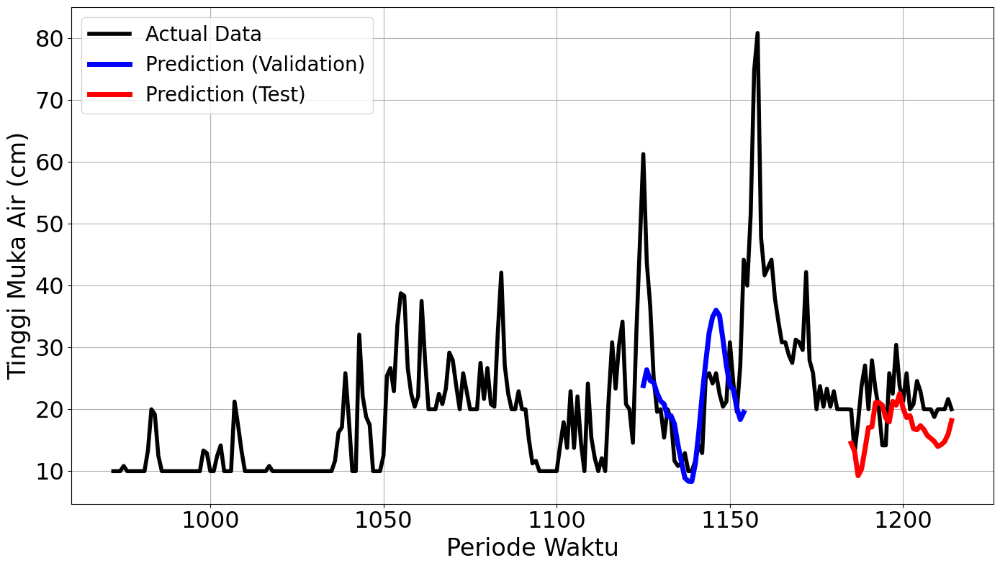

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.3535
Final Average MAPE Test: 0.4822
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0517 - val_loss: 0.0213
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0062 - val_loss: 0.0330
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0052 - val_loss: 0.0353
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0104 - val_loss: 0.0561
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0081 - val_loss: 0.0254
Epoch 6/150
89/93 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0061Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0060 - val_loss: 0.0380
Epoch 00006: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
mape validation = 40.84465652408074 %
mape test = 32.385787167938574 %


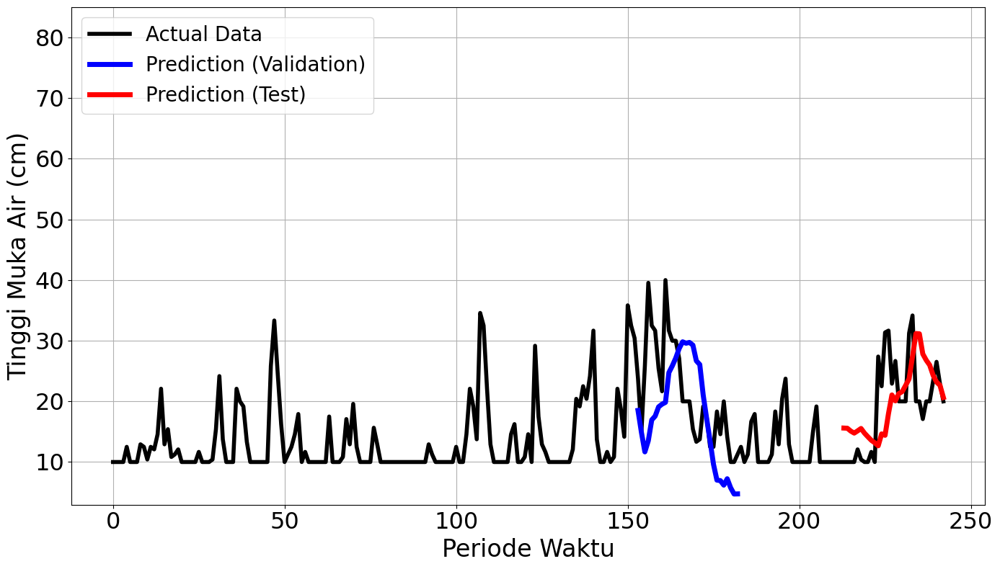

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0581 - val_loss: 0.1359
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0304 - val_loss: 0.0315
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0154 - val_loss: 0.0367
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0100 - val_loss: 0.0388
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0136 - val_loss: 0.0523
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0094 - val_loss: 0.0466
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0103 - val_loss: 0.0296
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0092 - val_loss: 0.0443
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0126 - val_loss: 0.0424
Epoch 10/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0119 - val_loss: 0.0528
Epoch 11/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0122 - val_loss: 0.0550
Epoch 12/150
86/93 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0116Restor

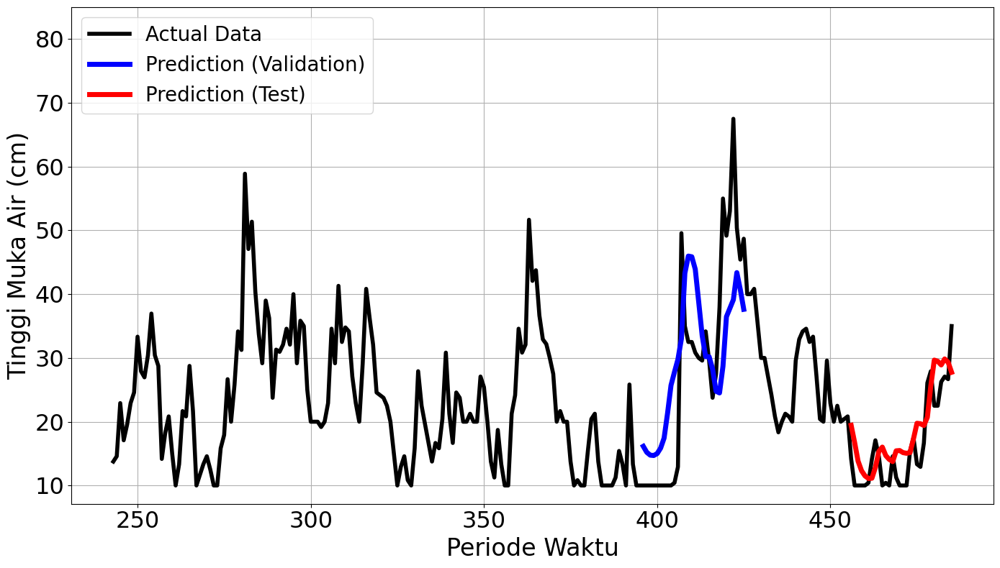

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 0.0331 - val_loss: 3.6417e-04
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0144 - val_loss: 0.0019
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0058 - val_loss: 1.5957e-04
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0027 - val_loss: 0.0017
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0087 - val_loss: 3.1833e-04
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0014 - val_loss: 1.8584e-04
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0025 - val_loss: 1.6375e-04
Epoch 8/150
92/93 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0046Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0046 - val_loss: 2.6795e-04
Epoch 00008: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
mape validation = 4.068506219918473 %
mape test = 26.928829071319104 %


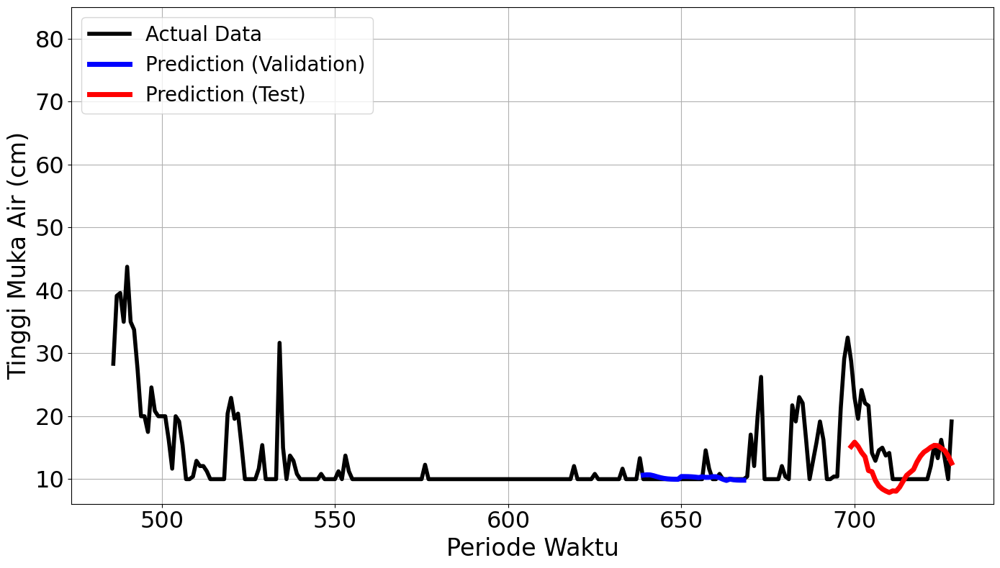

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 0.0644 - val_loss: 0.0441
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0179 - val_loss: 0.0120
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0180 - val_loss: 0.0251
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0155 - val_loss: 0.0206
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0109 - val_loss: 0.0210
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0103 - val_loss: 0.0138
Epoch 7/150
92/93 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0117Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0117 - val_loss: 0.0154
Epoch 00007: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
mape validation = 56.1974817593516 %
mape test = 129.7325798193851 %


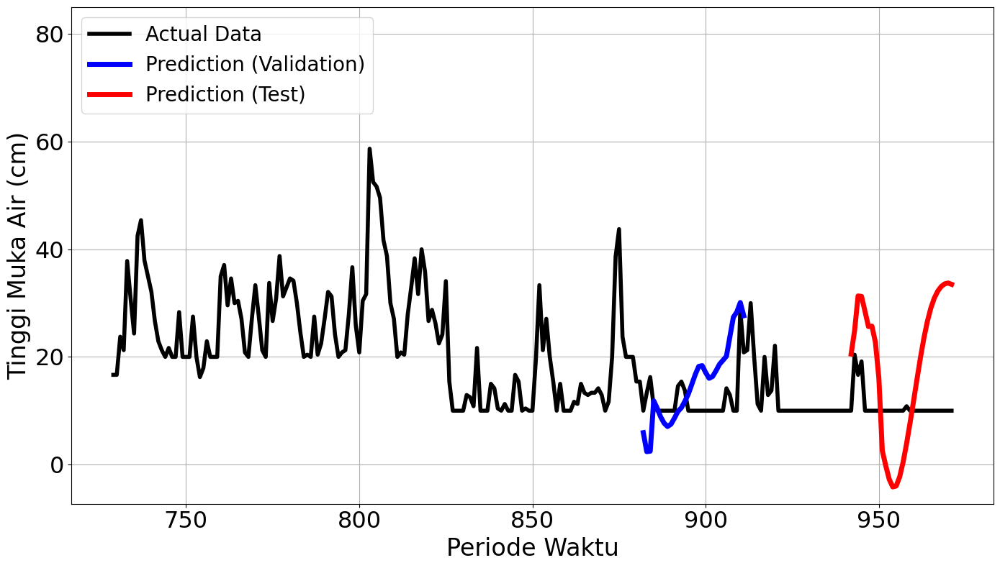

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0420 - val_loss: 0.0425
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0102 - val_loss: 0.0388
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0070 - val_loss: 0.0302
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0106 - val_loss: 0.0375
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0077 - val_loss: 0.0344
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0060 - val_loss: 0.0441
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0063 - val_loss: 0.0403
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0067 - val_loss: 0.0230
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0049 - val_loss: 0.0374
Epoch 10/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0081 - val_loss: 0.0275
Epoch 11/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0086 - val_loss: 0.0232
Epoch 12/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0072 - va

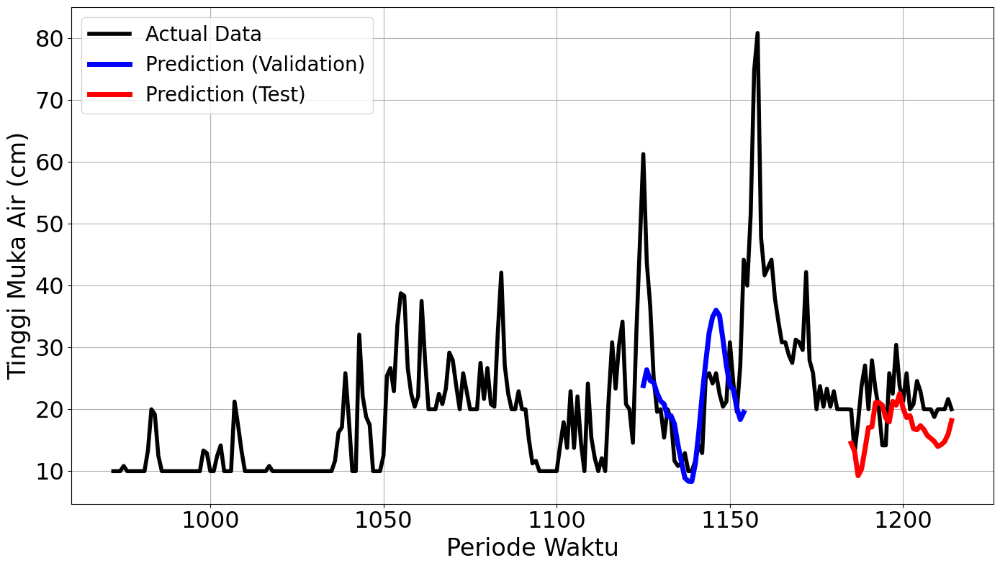

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.3535
Final Average MAPE Test: 0.4822
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.1171 - val_loss: 0.1565
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0237 - val_loss: 0.0713
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0161 - val_loss: 0.0207
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0099 - val_loss: 0.0222
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0090 - val_loss: 0.0184
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0072 - val_loss: 0.0190
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0068 - val_loss: 0.0210
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0064 - val_loss: 0.0221
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0038 - val_loss: 0.0225
Epoch 10/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0032Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0051 - val_loss: 0.0231
Epoch 00010: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/s

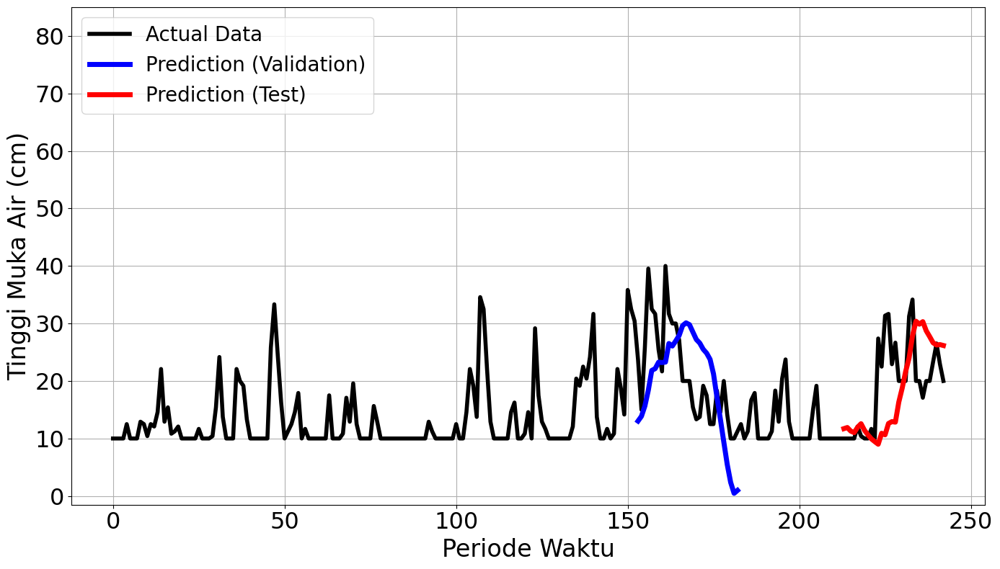

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0470 - val_loss: 0.1344
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0540 - val_loss: 0.1463
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0463 - val_loss: 0.1400
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0182 - val_loss: 0.1153
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0154 - val_loss: 0.1014
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0190 - val_loss: 0.1022
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0179 - val_loss: 0.1111
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0146 - val_loss: 0.1116
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0160 - val_loss: 0.1141
Epoch 10/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0155Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0157 - val_loss: 0.1139
Epoch 00010: early stopping
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/s

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
mape validation = 124.44803385839096 %
mape test = 96.56397974192032 %


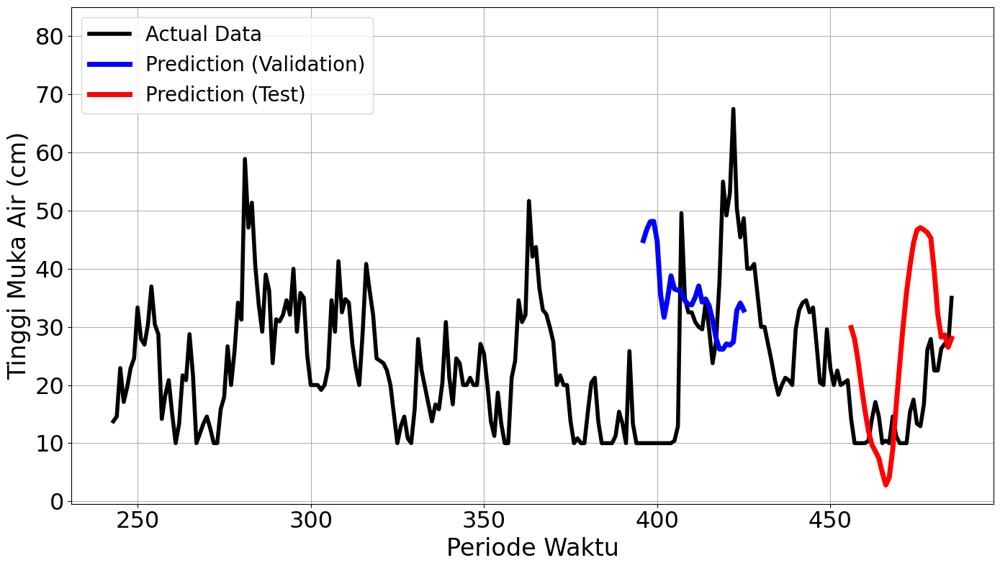

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.0564 - val_loss: 0.0042
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0321 - val_loss: 0.0024
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0220 - val_loss: 6.9867e-04
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0052 - val_loss: 2.0546e-04
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0082 - val_loss: 2.4192e-04
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0039 - val_loss: 2.7947e-04
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0029 - val_loss: 2.4708e-04
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0022 - val_loss: 3.4183e-04
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0033 - val_loss: 1.9921e-04
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0024 - val_loss: 4.2992e-04
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0024 - val_loss: 5.1013e-04
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
mape validation = 5.8206237422655915 %
mape test = 43.92127669287511 %


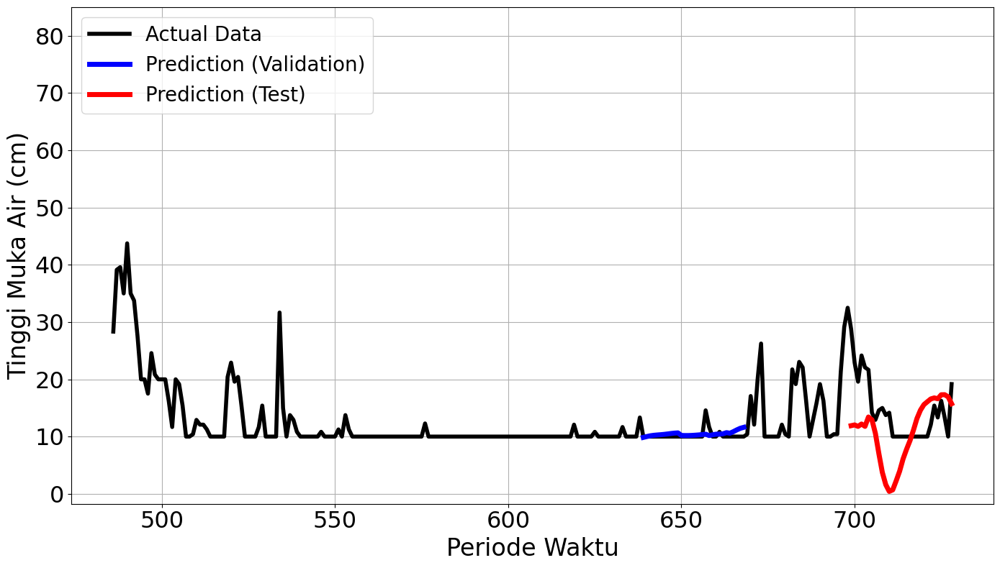

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.1255 - val_loss: 0.0633
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0245 - val_loss: 0.0115
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0215 - val_loss: 0.0071
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0147 - val_loss: 0.0089
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0201 - val_loss: 0.0115
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0105 - val_loss: 0.0061
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0144 - val_loss: 0.0053
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0203 - val_loss: 0.0064
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0112 - val_loss: 0.0072
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0190 - val_loss: 0.0072
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0108 - val_loss: 0.0074
Epoch 12/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0066Restoring model weigh

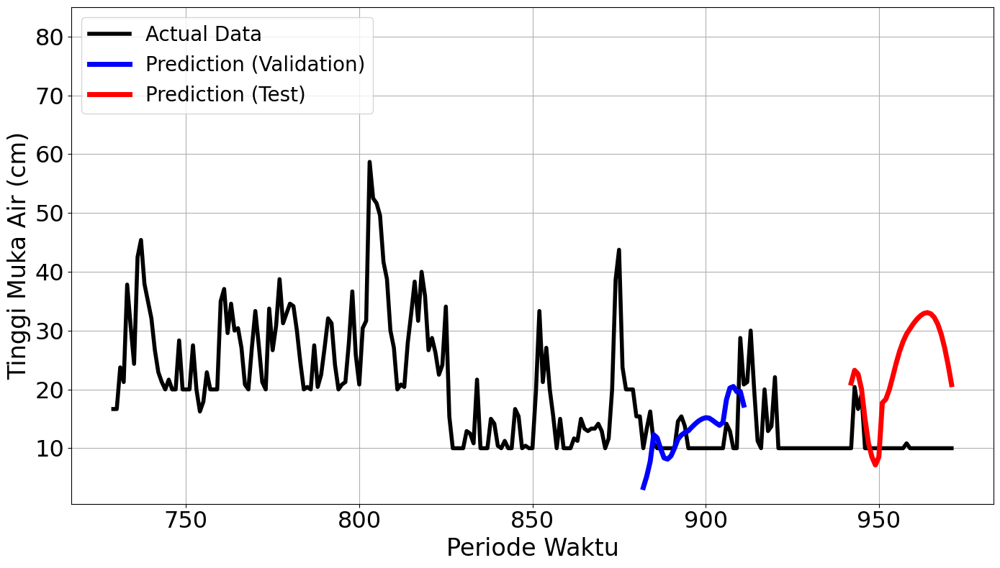

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.0704 - val_loss: 0.0977
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0413 - val_loss: 0.0629
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0133 - val_loss: 0.0476
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0152 - val_loss: 0.0364
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0088 - val_loss: 0.0376
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0127 - val_loss: 0.0322
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0110 - val_loss: 0.0301
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - val_loss: 0.0296
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0130 - val_loss: 0.0320
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0105 - val_loss: 0.0352
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0051 - val_loss: 0.0376
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0047 - val_loss: 0.0374
E

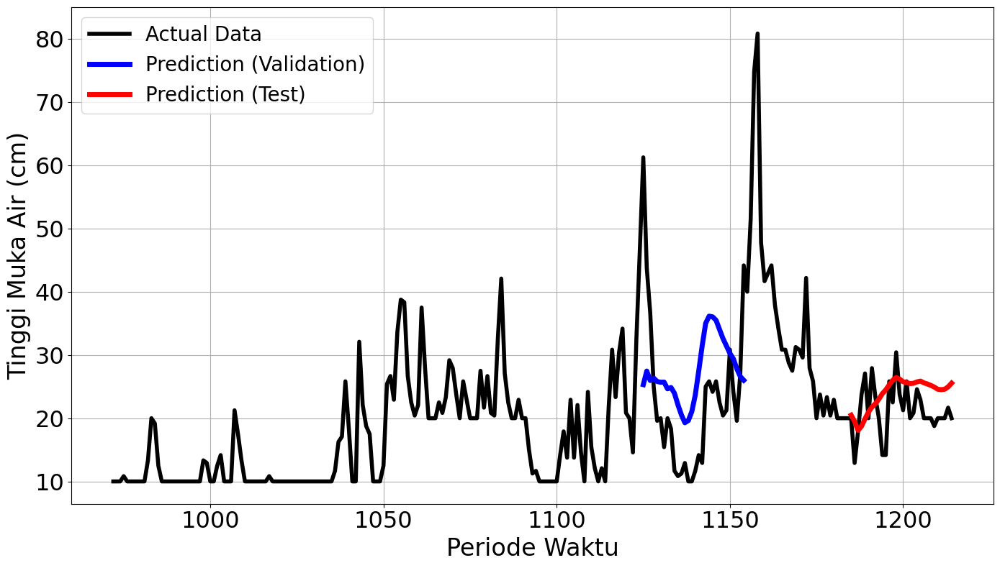

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.5357
Final Average MAPE Test: 0.6426
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.1171 - val_loss: 0.1565
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0237 - val_loss: 0.0713
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0161 - val_loss: 0.0207
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0099 - val_loss: 0.0222
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0090 - val_loss: 0.0184
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0072 - val_loss: 0.0190
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0068 - val_loss: 0.0210
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0064 - val_loss: 0.0221
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0038 - val_loss: 0.0225
Epoch 10/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0032Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0051 - val_loss: 0.0231
Epoch 00010: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 645ms/s

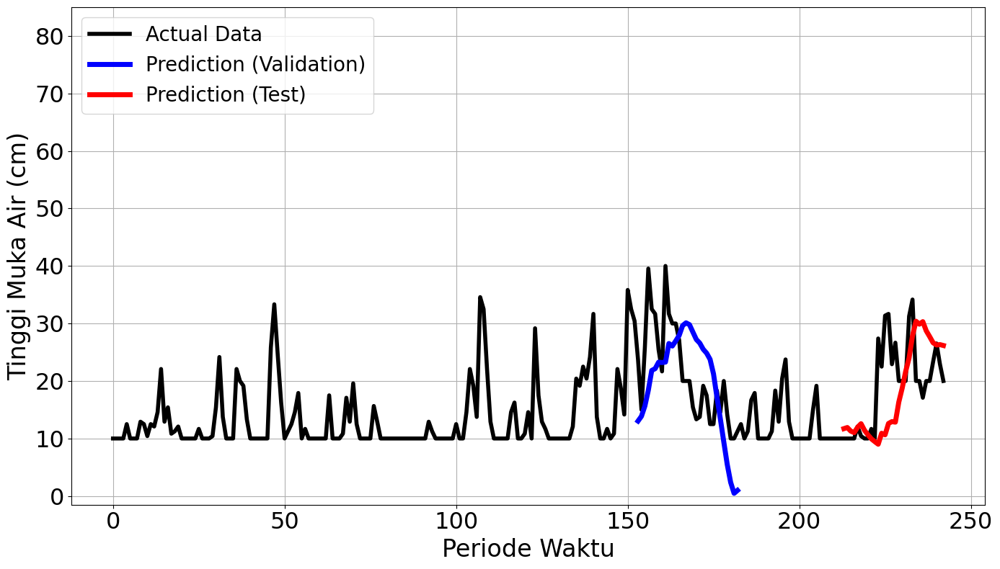

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0470 - val_loss: 0.1344
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0540 - val_loss: 0.1463
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0463 - val_loss: 0.1400
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0182 - val_loss: 0.1153
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0154 - val_loss: 0.1014
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0190 - val_loss: 0.1022
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0179 - val_loss: 0.1111
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0146 - val_loss: 0.1116
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0160 - val_loss: 0.1141
Epoch 10/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0155Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0157 - val_loss: 0.1139
Epoch 00010: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/s

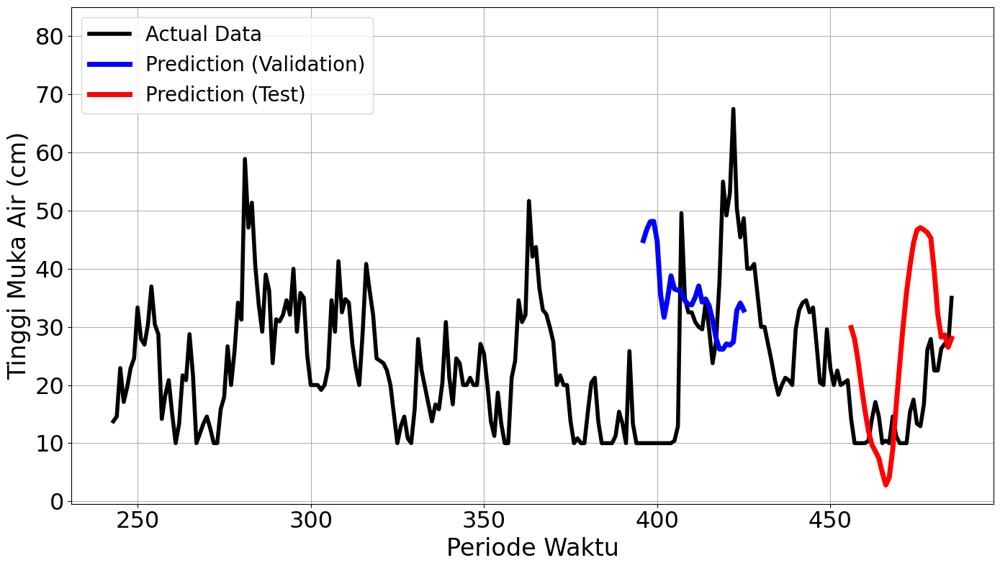

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - loss: 0.0564 - val_loss: 0.0042
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0321 - val_loss: 0.0024
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0220 - val_loss: 6.9867e-04
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0052 - val_loss: 2.0546e-04
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0082 - val_loss: 2.4192e-04
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0039 - val_loss: 2.7947e-04
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0029 - val_loss: 2.4708e-04
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0022 - val_loss: 3.4183e-04
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0033 - val_loss: 1.9921e-04
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0024 - val_loss: 4.2992e-04
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0024 - val_loss: 5.1013e-04
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

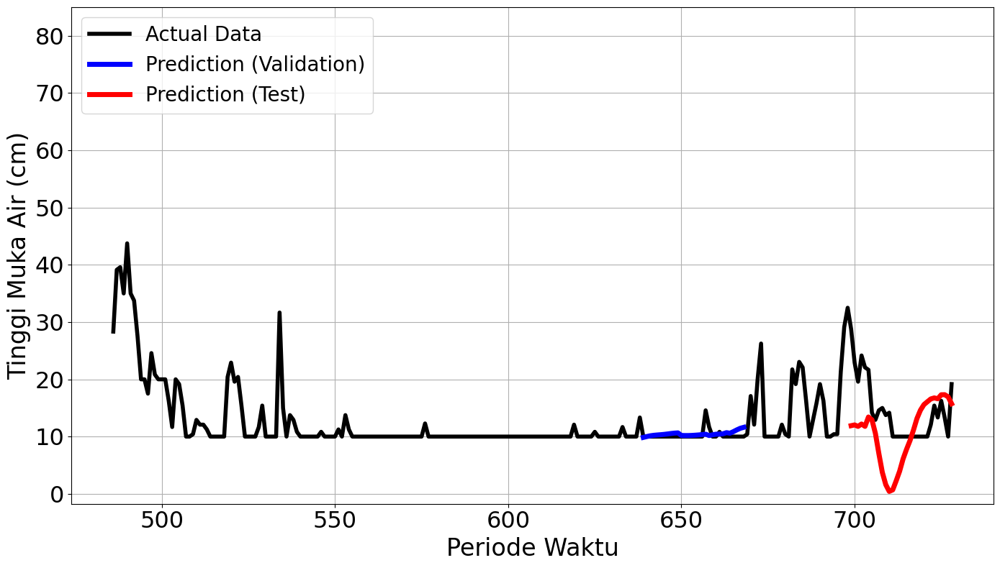

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1255 - val_loss: 0.0633
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0245 - val_loss: 0.0115
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0215 - val_loss: 0.0071
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0147 - val_loss: 0.0089
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0201 - val_loss: 0.0115
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0105 - val_loss: 0.0061
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0144 - val_loss: 0.0053
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0203 - val_loss: 0.0064
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0112 - val_loss: 0.0072
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0190 - val_loss: 0.0072
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0108 - val_loss: 0.0074
Epoch 12/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0066Restoring model weigh

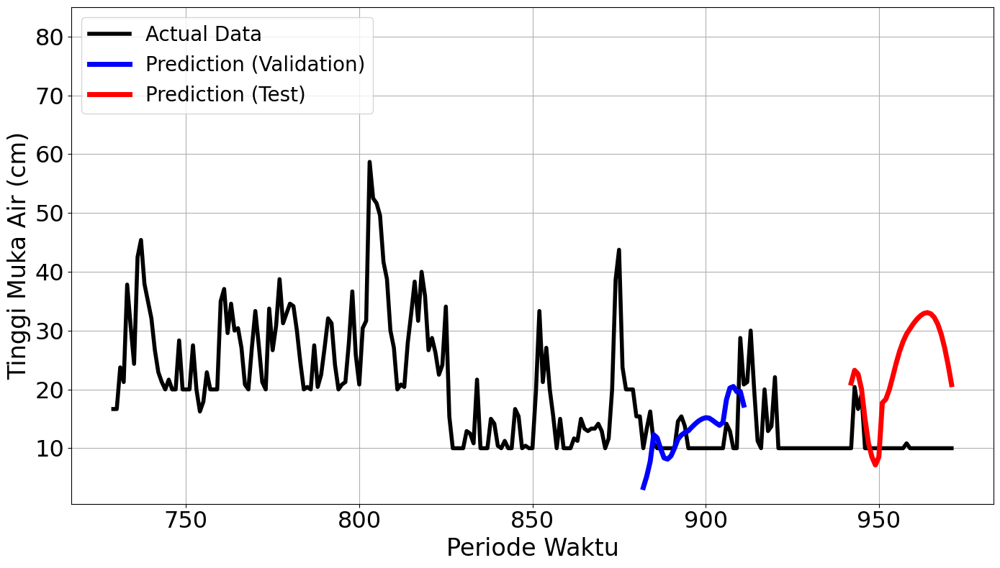

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.0704 - val_loss: 0.0977
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0413 - val_loss: 0.0629
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0133 - val_loss: 0.0476
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0152 - val_loss: 0.0364
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0088 - val_loss: 0.0376
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0127 - val_loss: 0.0322
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0110 - val_loss: 0.0301
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0089 - val_loss: 0.0296
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0130 - val_loss: 0.0320
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0105 - val_loss: 0.0352
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0051 - val_loss: 0.0376
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0047 - val_loss: 0.0374


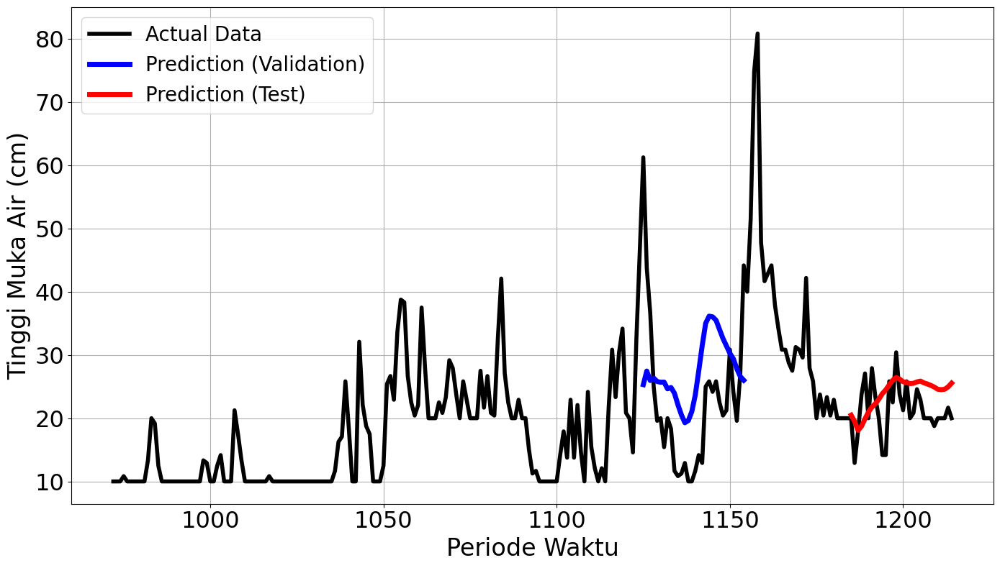

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.5357
Final Average MAPE Test: 0.6426
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 341ms/step - loss: 0.2067 - val_loss: 0.0725
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0376 - val_loss: 0.1156
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0202 - val_loss: 0.1181
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0187 - val_loss: 0.0834
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0162 - val_loss: 0.0443
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0131 - val_loss: 0.0267
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0128 - val_loss: 0.0201
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0129 - val_loss: 0.0186
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0113 - val_loss: 0.0182
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0104 - val_loss: 0.0184
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0081 - val_loss: 0.0184
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0077 - val_loss: 0.0178


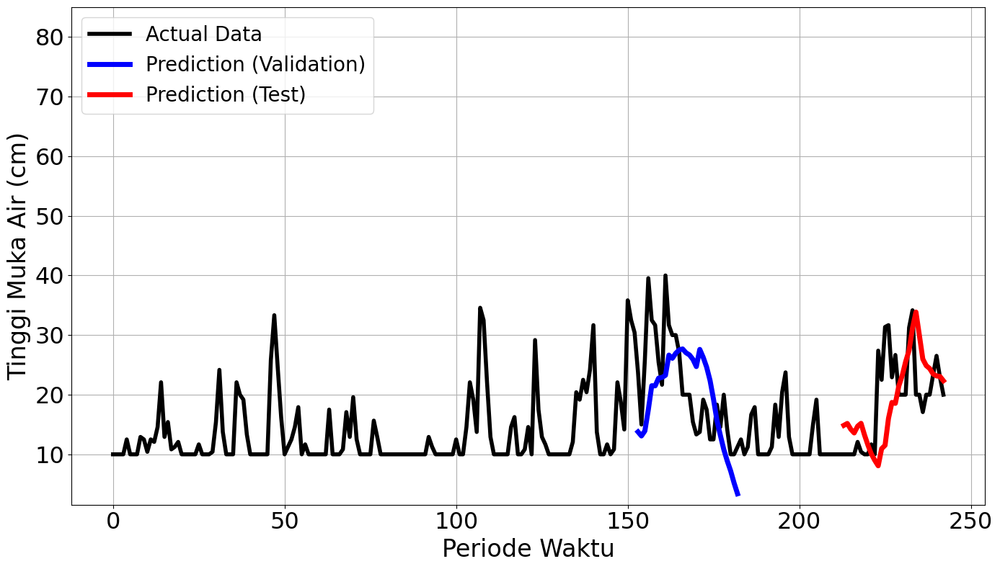

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 326ms/step - loss: 0.0451 - val_loss: 0.1742
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0462 - val_loss: 0.1349
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.0415 - val_loss: 0.1240
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - loss: 0.0260 - val_loss: 0.1231
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.0323 - val_loss: 0.1263
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 202ms/step - loss: 0.0282 - val_loss: 0.1204
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 185ms/step - loss: 0.0196 - val_loss: 0.1162
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - loss: 0.0182 - val_loss: 0.1071
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0169 - val_loss: 0.0977
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.0214 - val_loss: 0.0896
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0180 - val_loss: 0.0863
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0264 - val_los

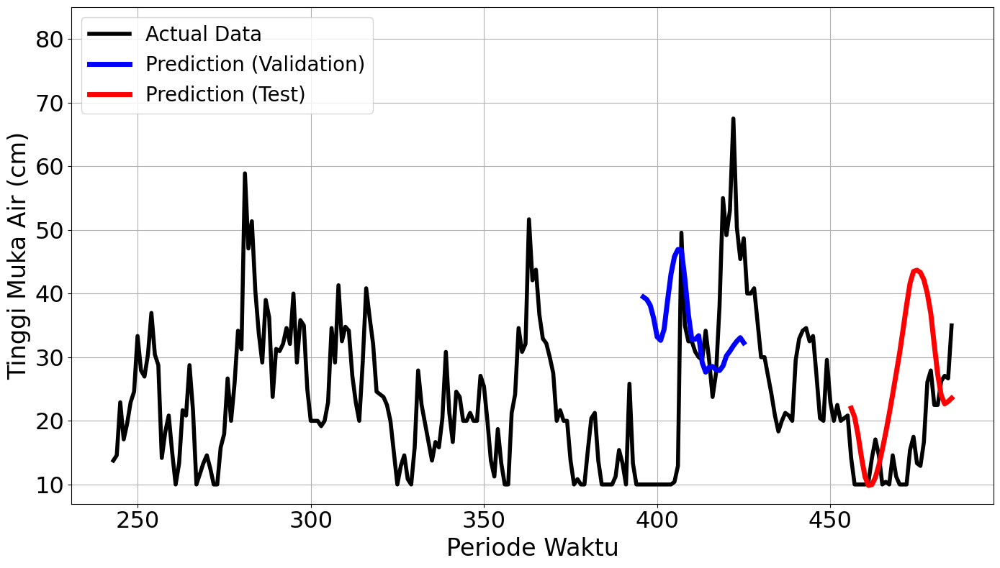

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 338ms/step - loss: 0.1880 - val_loss: 5.3789e-04
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0179 - val_loss: 0.0061
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0132 - val_loss: 0.0036
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0118 - val_loss: 6.7575e-04
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0122 - val_loss: 6.9568e-04
Epoch 6/150
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0018Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0087 - val_loss: 0.0016
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
mape validation = 13.994408912130895 %
mape test = 134.18608705955756 %


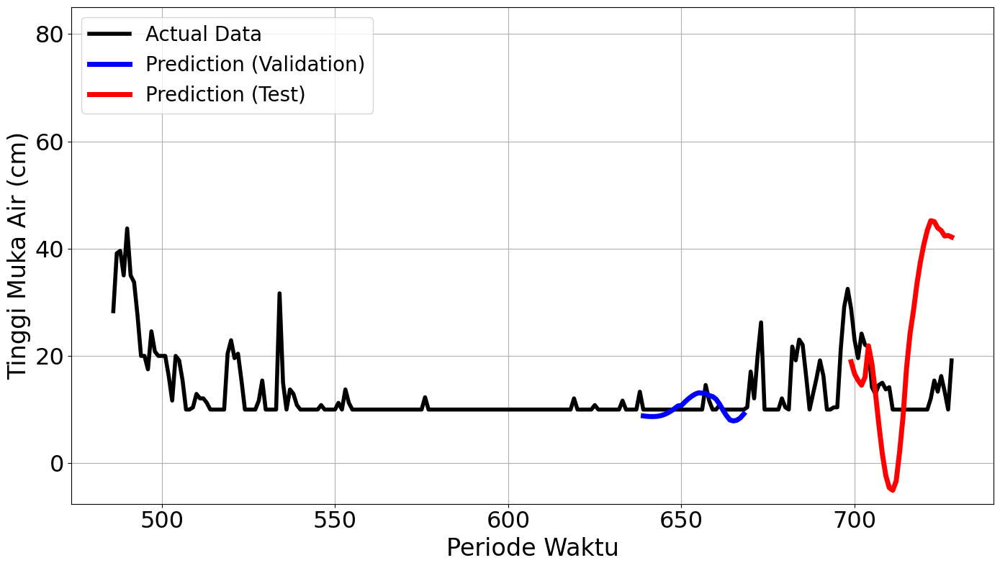

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 334ms/step - loss: 0.1055 - val_loss: 0.2476
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.1038 - val_loss: 0.0965
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0430 - val_loss: 0.0179
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0204 - val_loss: 0.0238
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0301 - val_loss: 0.0363
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.0293 - val_loss: 0.0306
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0227 - val_loss: 0.0217
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0211 - val_loss: 0.0123
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0154 - val_loss: 0.0096
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0198 - val_loss: 0.0103
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0139 - val_loss: 0.0117
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.0169 - val_loss: 0.0125

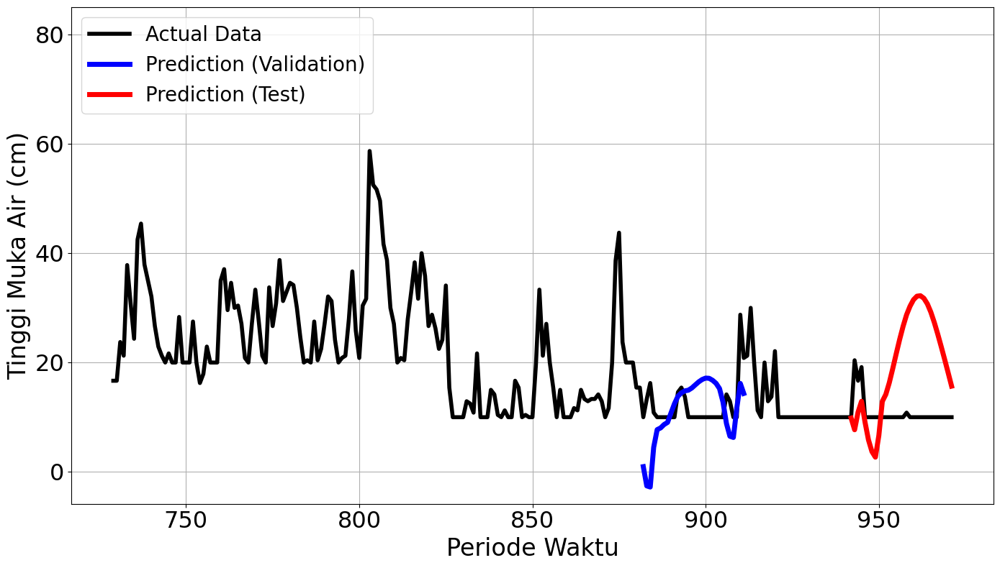

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 353ms/step - loss: 0.1288 - val_loss: 0.0206
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0330 - val_loss: 0.0391
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0302 - val_loss: 0.0452
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0208 - val_loss: 0.0481
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0214 - val_loss: 0.0449
Epoch 6/150
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0073Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0105 - val_loss: 0.0407
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
mape validation = 35.997779404397136 %
mape test = 18.66517683151615 %


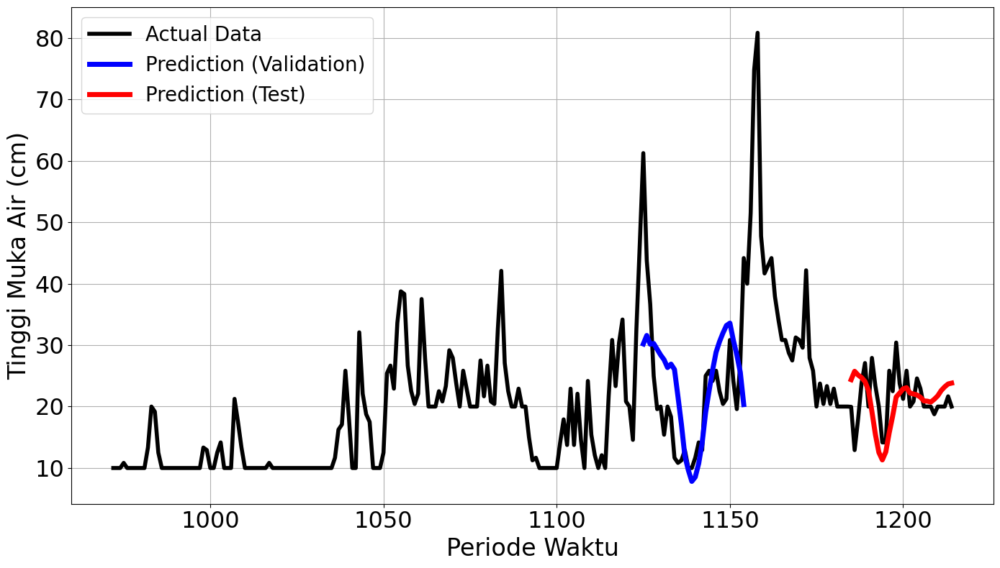

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.4982
Final Average MAPE Test: 0.7701
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 326ms/step - loss: 0.2067 - val_loss: 0.0725
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0376 - val_loss: 0.1156
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0202 - val_loss: 0.1181
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0187 - val_loss: 0.0834
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0162 - val_loss: 0.0443
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0131 - val_loss: 0.0267
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0128 - val_loss: 0.0201
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0129 - val_loss: 0.0186
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0113 - val_loss: 0.0182
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0104 - val_loss: 0.0184
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0081 - val_loss: 0.0184
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0077 - val_loss: 0.0178


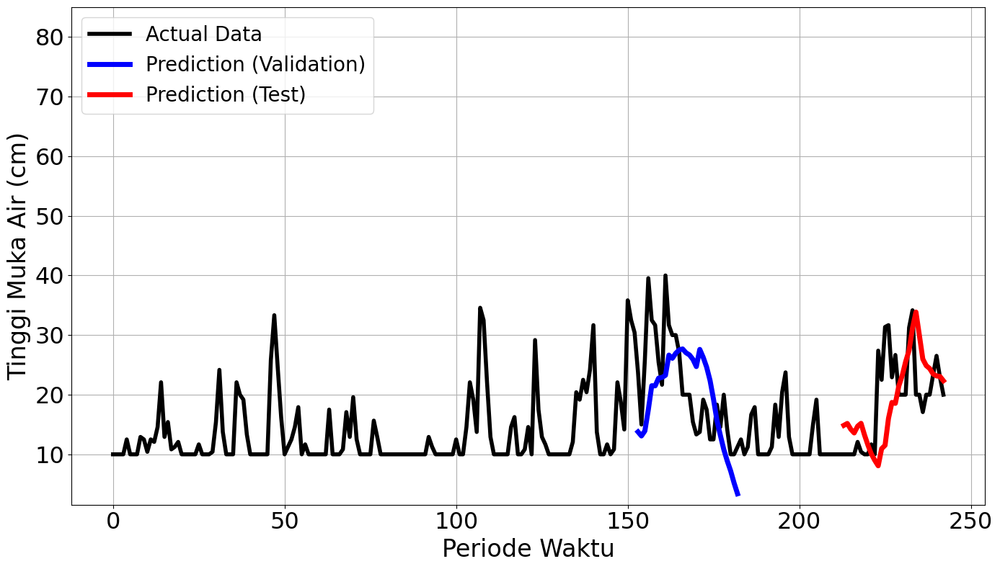

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 330ms/step - loss: 0.0451 - val_loss: 0.1742
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.0462 - val_loss: 0.1349
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0415 - val_loss: 0.1240
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 0.0260 - val_loss: 0.1231
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0323 - val_loss: 0.1263
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0282 - val_loss: 0.1204
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0196 - val_loss: 0.1162
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0182 - val_loss: 0.1071
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.0169 - val_loss: 0.0977
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.0214 - val_loss: 0.0896
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0180 - val_loss: 0.0863
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.0264 - val_loss:

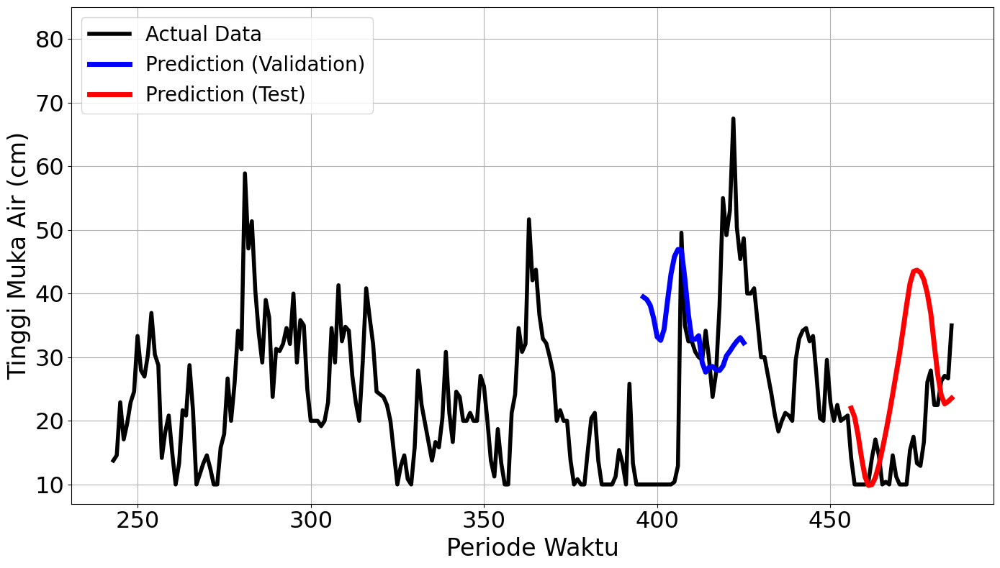

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 334ms/step - loss: 0.1880 - val_loss: 5.3789e-04
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0179 - val_loss: 0.0061
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.0132 - val_loss: 0.0036
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0118 - val_loss: 6.7575e-04
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0122 - val_loss: 6.9568e-04
Epoch 6/150
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.0018Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0087 - val_loss: 0.0016
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
mape validation = 13.994408912130895 %
mape test = 134.18608705955756 %


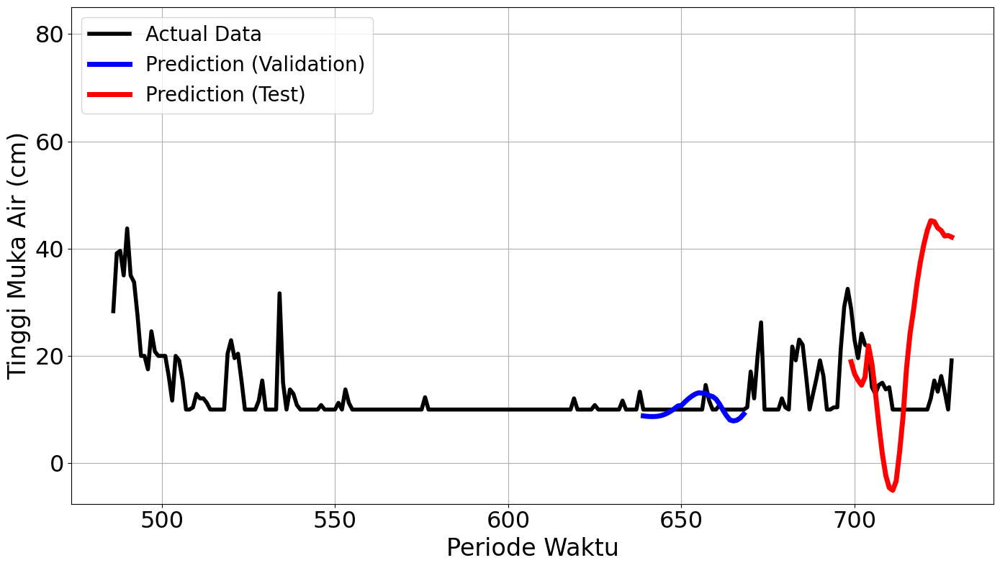

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 349ms/step - loss: 0.1055 - val_loss: 0.2476
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.1038 - val_loss: 0.0965
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0430 - val_loss: 0.0179
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0204 - val_loss: 0.0238
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0301 - val_loss: 0.0363
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0293 - val_loss: 0.0306
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0227 - val_loss: 0.0217
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0211 - val_loss: 0.0123
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0154 - val_loss: 0.0096
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.0198 - val_loss: 0.0103
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0139 - val_loss: 0.0117
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0169 - val_loss: 0.0125


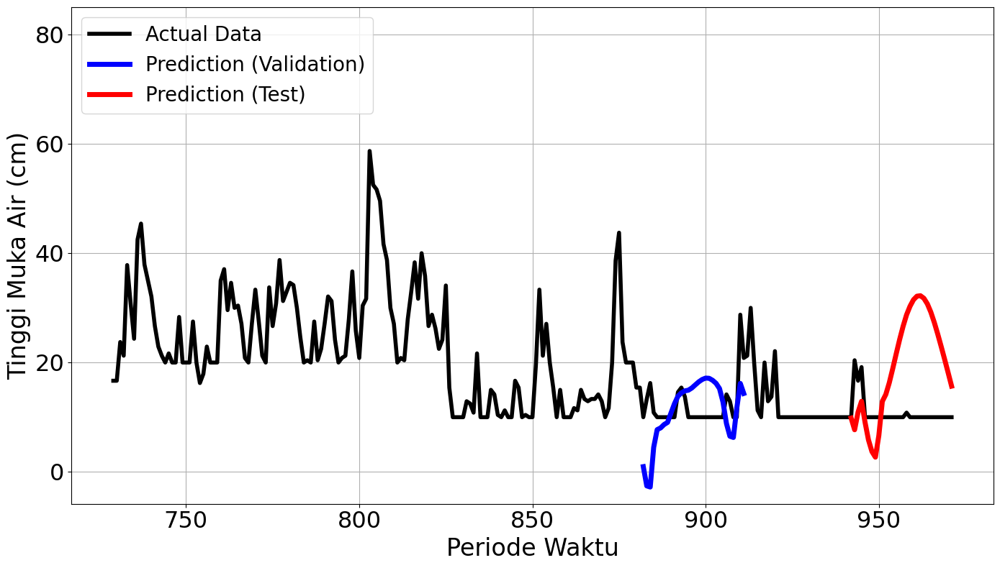

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 501ms/step - loss: 0.1288 - val_loss: 0.0206
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.0330 - val_loss: 0.0391
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0302 - val_loss: 0.0452
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.0208 - val_loss: 0.0481
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0214 - val_loss: 0.0449
Epoch 6/150
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - loss: 0.0073Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0105 - val_loss: 0.0407
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
mape validation = 35.997779404397136 %
mape test = 18.66517683151615 %


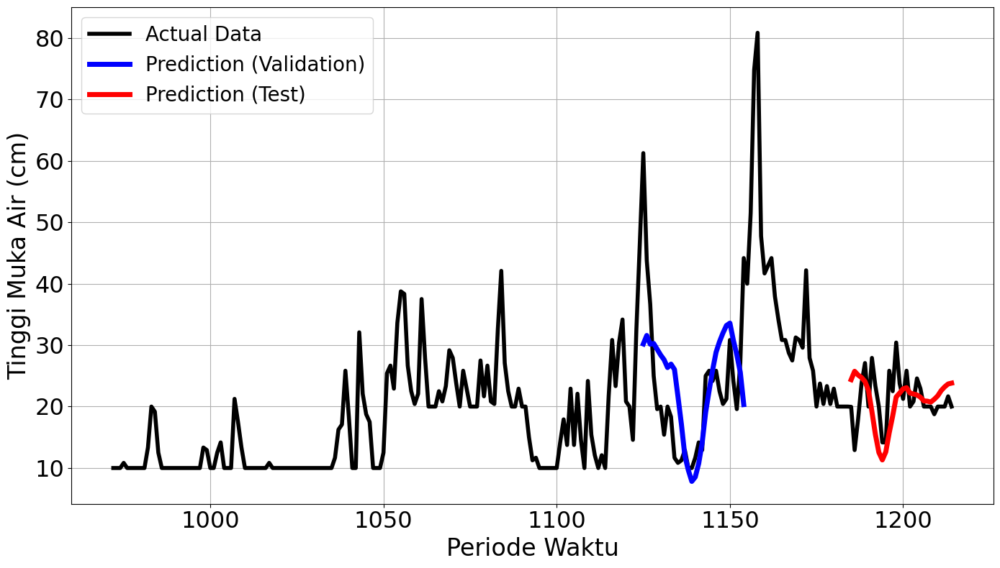

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.4982
Final Average MAPE Test: 0.7701
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.1945 - val_loss: 0.0535
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step - loss: 0.1077 - val_loss: 0.0789
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.0564 - val_loss: 0.1024
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0278 - val_loss: 0.1152
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step - loss: 0.0221 - val_loss: 0.1129
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0216Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0216 - val_loss: 0.0980
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
mape validation = 70.2253616568346 %
mape test = 138.02696936081495 %


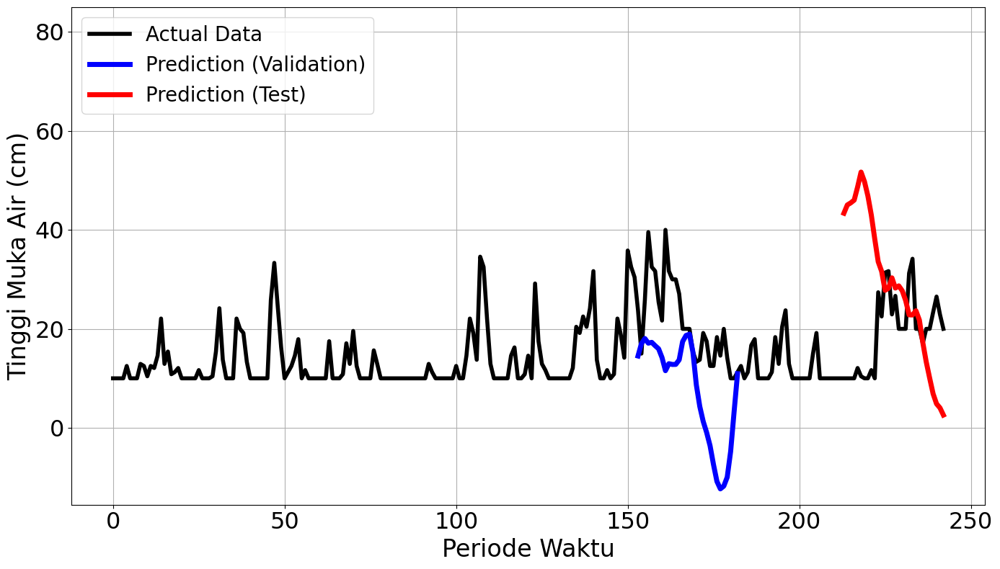

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.0421 - val_loss: 0.1900
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0295 - val_loss: 0.1913
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.0343 - val_loss: 0.1829
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 737ms/step - loss: 0.0302 - val_loss: 0.1708
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 669ms/step - loss: 0.0213 - val_loss: 0.1635
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0205 - val_loss: 0.1611
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.0148 - val_loss: 0.1601
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.0178 - val_loss: 0.1581
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.0196 - val_loss: 0.1558
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.0153 - val_loss: 0.1536
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.0165 - val_loss: 0.1511
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0141 - val_loss: 0.

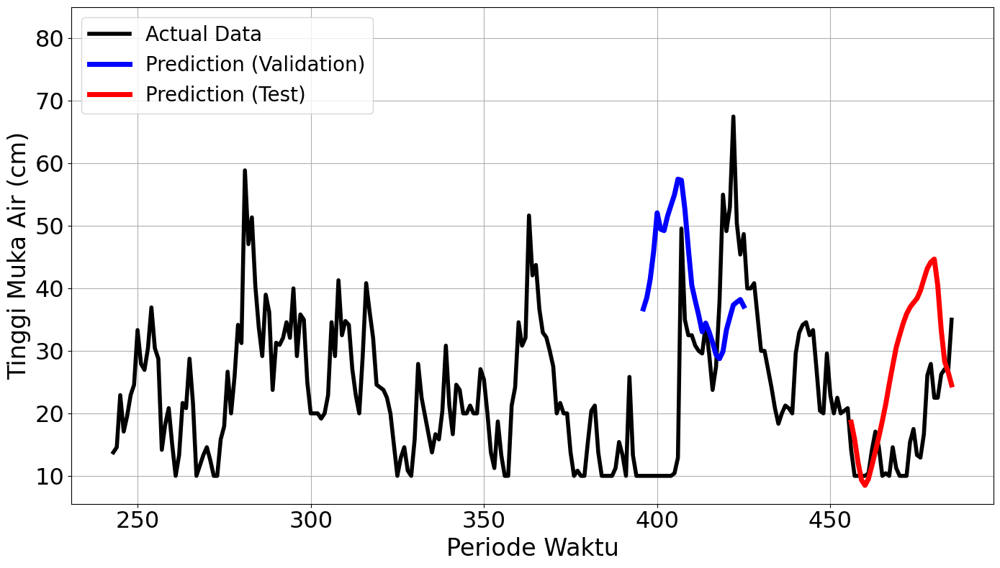

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.1632 - val_loss: 0.0044
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0862 - val_loss: 0.0067
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - loss: 0.0415 - val_loss: 0.0028
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step - loss: 0.0184 - val_loss: 5.1594e-04
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0203 - val_loss: 8.2984e-04
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - loss: 0.0249 - val_loss: 0.0021
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0265 - val_loss: 0.0027
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0220 - val_loss: 0.0022
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0210Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0210 - val_loss: 0.0012
Epoch 00009: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
mape validation = 13.944682395

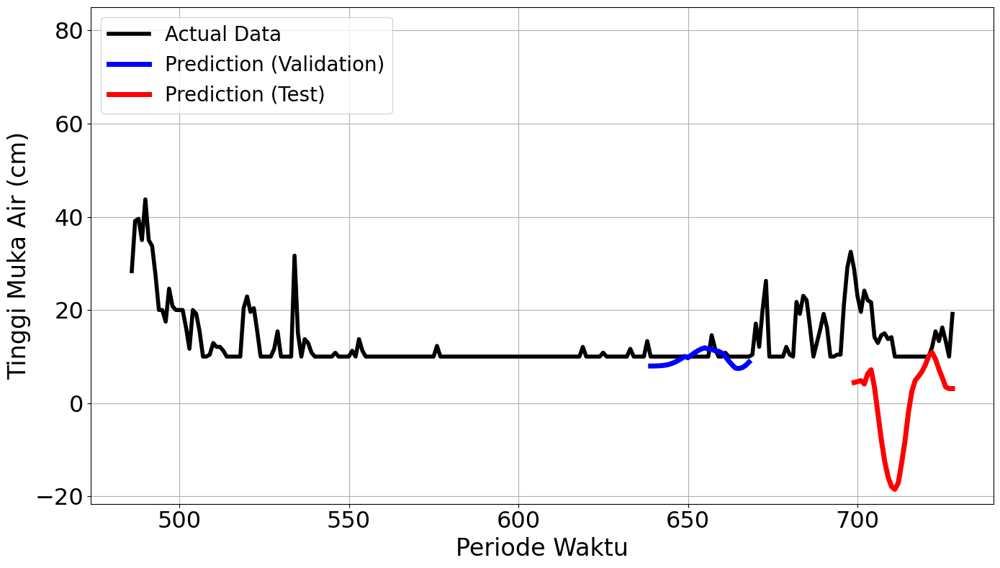

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.1128 - val_loss: 0.2447
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - loss: 0.0578 - val_loss: 0.1851
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - loss: 0.0600 - val_loss: 0.1141
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 0.0475 - val_loss: 0.0522
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0327 - val_loss: 0.0165
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0246 - val_loss: 0.0084
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0194 - val_loss: 0.0153
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.0222 - val_loss: 0.0253
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step - loss: 0.0283 - val_loss: 0.0307
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0281 - val_loss: 0.0309
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0246Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss

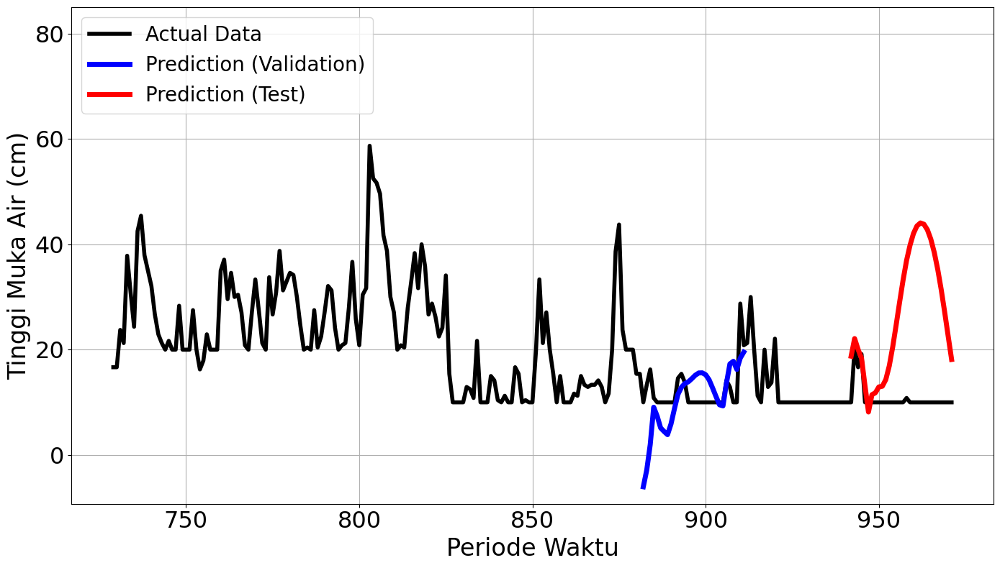

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.1288 - val_loss: 0.0190
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 0.0761 - val_loss: 0.0242
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step - loss: 0.0555 - val_loss: 0.0266
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.0300 - val_loss: 0.0262
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step - loss: 0.0231 - val_loss: 0.0263
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0190Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - loss: 0.0190 - val_loss: 0.0272
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
mape validation = 35.689480216907924 %
mape test = 19.17424921758804 %


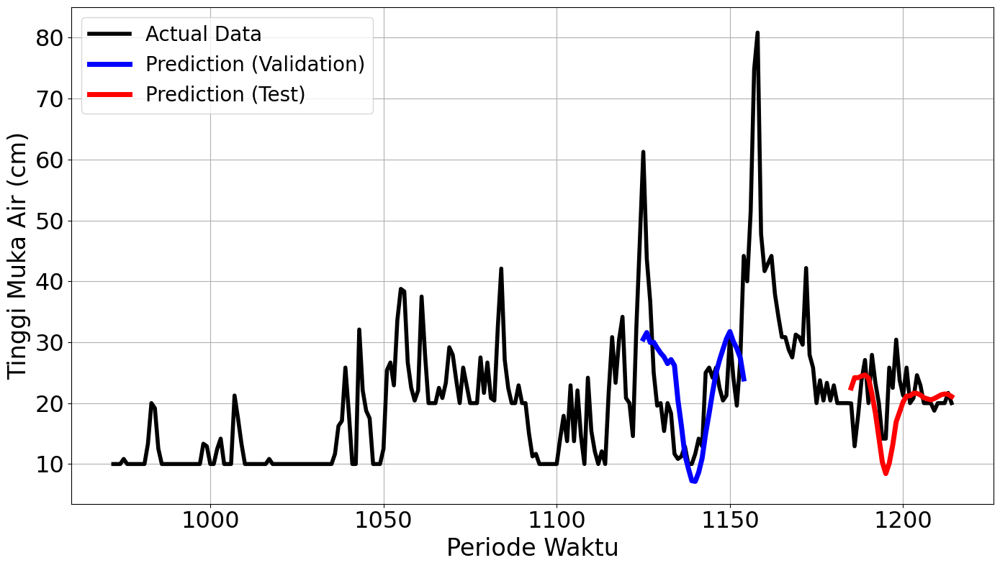

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.6277
Final Average MAPE Test: 1.0141
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.1945 - val_loss: 0.0535
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.1077 - val_loss: 0.0789
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - loss: 0.0564 - val_loss: 0.1024
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0278 - val_loss: 0.1152
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.0221 - val_loss: 0.1129
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0216Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0216 - val_loss: 0.0980
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
mape validation = 70.2253616568346 %
mape test = 138.02696936081495 %


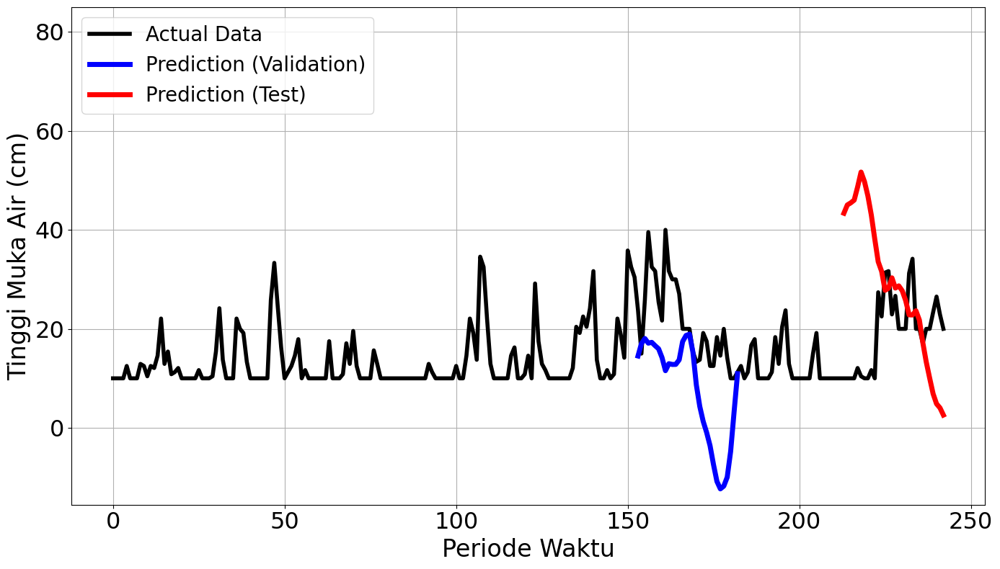

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.0421 - val_loss: 0.1900
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0295 - val_loss: 0.1913
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.0343 - val_loss: 0.1829
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - loss: 0.0302 - val_loss: 0.1708
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step - loss: 0.0213 - val_loss: 0.1635
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0205 - val_loss: 0.1611
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0148 - val_loss: 0.1601
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0178 - val_loss: 0.1581
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0196 - val_loss: 0.1558
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - loss: 0.0153 - val_loss: 0.1536
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - loss: 0.0165 - val_loss: 0.1511
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0141 - val_loss: 

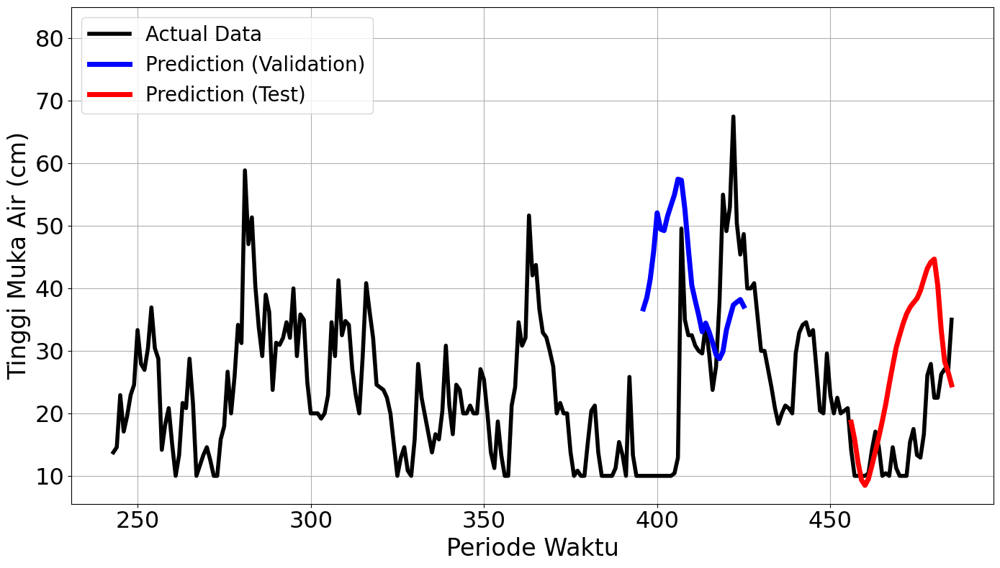

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.1632 - val_loss: 0.0044
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0862 - val_loss: 0.0067
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0415 - val_loss: 0.0028
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0184 - val_loss: 5.1594e-04
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0203 - val_loss: 8.2984e-04
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0249 - val_loss: 0.0021
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0265 - val_loss: 0.0027
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step - loss: 0.0220 - val_loss: 0.0022
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0210Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0210 - val_loss: 0.0012
Epoch 00009: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
mape validation = 13.9446823959129

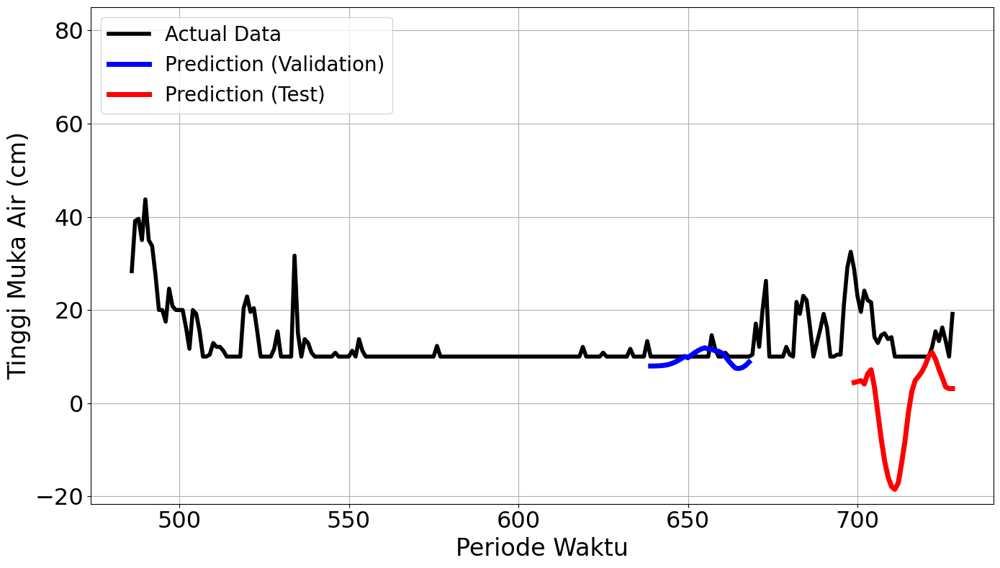

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.1128 - val_loss: 0.2447
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step - loss: 0.0578 - val_loss: 0.1851
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0600 - val_loss: 0.1141
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.0475 - val_loss: 0.0522
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step - loss: 0.0327 - val_loss: 0.0165
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0246 - val_loss: 0.0084
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 0.0194 - val_loss: 0.0153
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.0222 - val_loss: 0.0253
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0283 - val_loss: 0.0307
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.0281 - val_loss: 0.0309
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0246Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss:

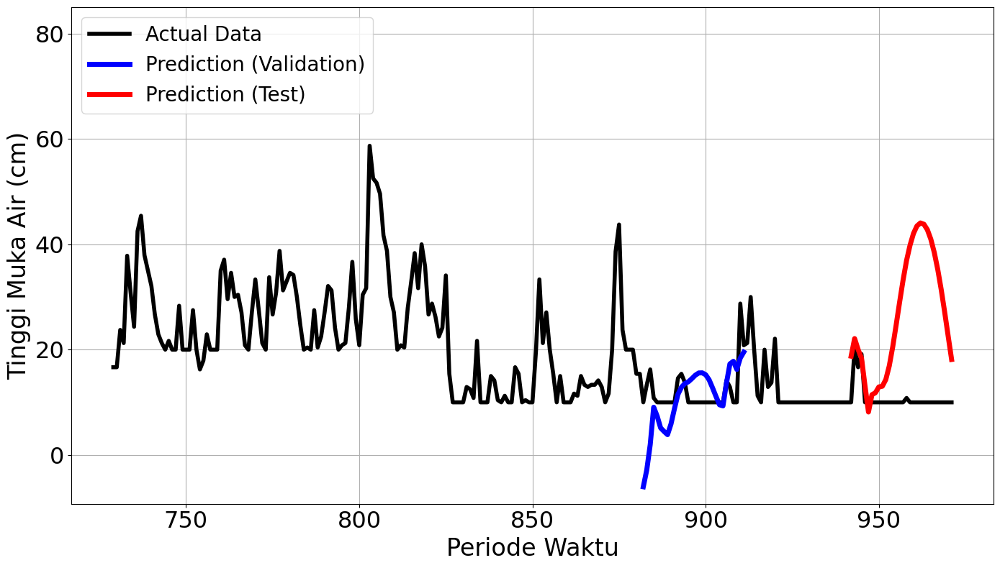

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.1288 - val_loss: 0.0190
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0761 - val_loss: 0.0242
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.0555 - val_loss: 0.0266
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0300 - val_loss: 0.0262
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.0231 - val_loss: 0.0263
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0190Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0190 - val_loss: 0.0272
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
mape validation = 35.689480216907924 %
mape test = 19.17424921758804 %


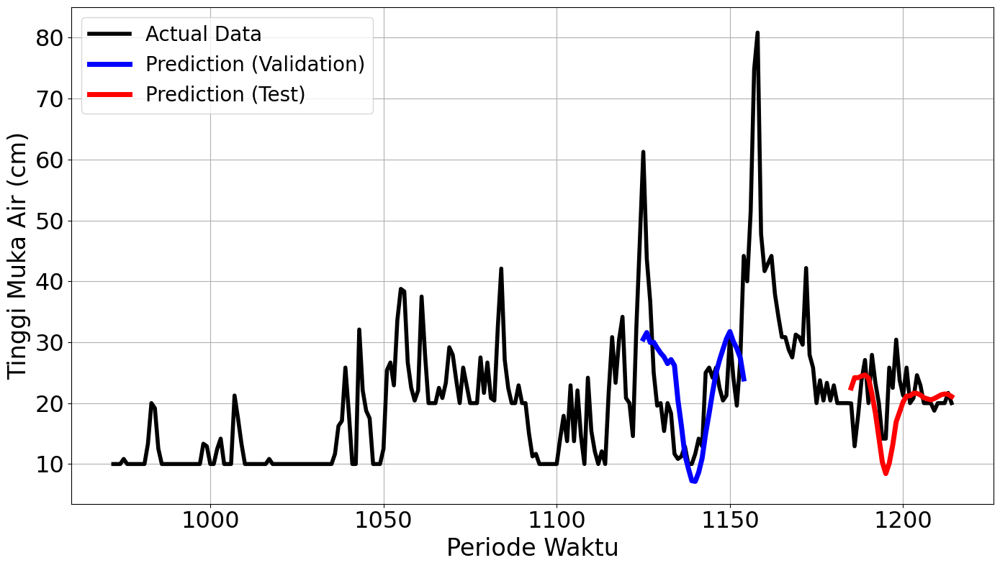

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.6277
Final Average MAPE Test: 1.0141
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - loss: 0.0527 - val_loss: 0.0143
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0055 - val_loss: 0.0217
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0044 - val_loss: 0.0096
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0077 - val_loss: 0.0178
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0057 - val_loss: 0.0129
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0064 - val_loss: 0.0190
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0032 - val_loss: 0.0157
Epoch 8/150
91/93 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0033Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0033 - val_loss: 0.0338
Epoch 00008: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
mape validation = 28.760547192654585 %
mape test = 32.10590154682072 %


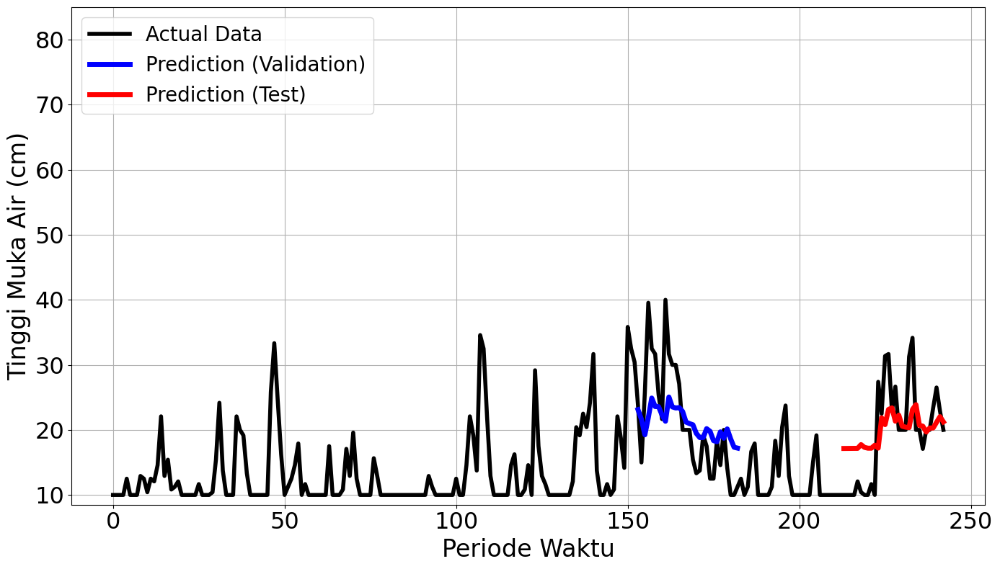

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - loss: 0.0385 - val_loss: 0.0263
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0172 - val_loss: 0.0320
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0153 - val_loss: 0.0319
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0103 - val_loss: 0.0241
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0117 - val_loss: 0.0243
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0081 - val_loss: 0.0185
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0099 - val_loss: 0.0216
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0081 - val_loss: 0.0218
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0118 - val_loss: 0.0183
Epoch 10/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0137 - val_loss: 0.0270
Epoch 11/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0136 - val_loss: 0.0235
Epoch 12/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0

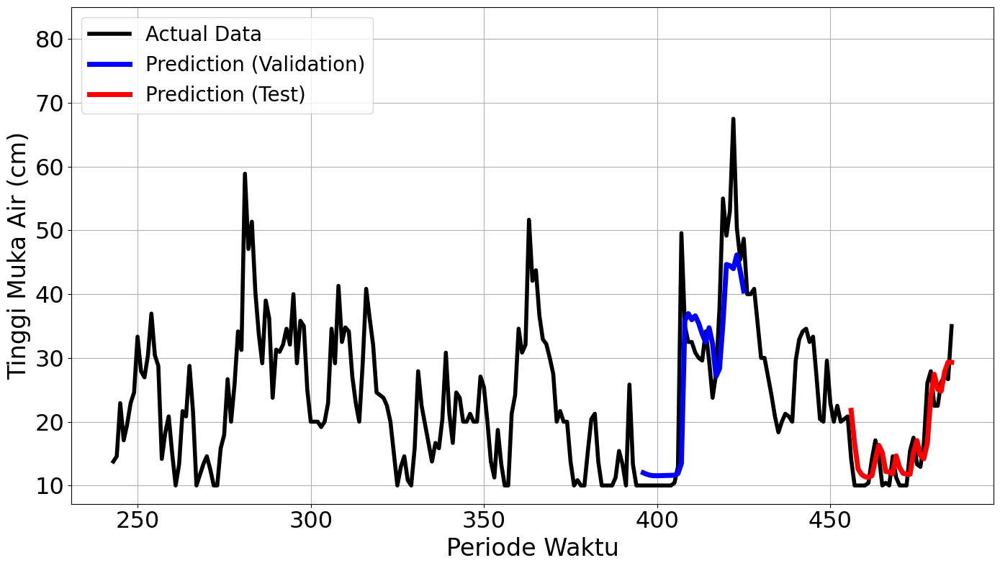

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - loss: 0.0257 - val_loss: 9.4088e-04
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0030 - val_loss: 9.0912e-04
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0060 - val_loss: 5.2689e-04
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0025 - val_loss: 1.9330e-04
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0063 - val_loss: 1.5955e-04
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0013 - val_loss: 1.7820e-04
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0016 - val_loss: 1.7367e-04
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0032 - val_loss: 2.7272e-04
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0035 - val_loss: 1.6944e-04
Epoch 10/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0019 - val_loss: 1.5164e-04
Epoch 11/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0018 - val_loss: 1.9657e-04
Epoch 12/150
93/93 ━

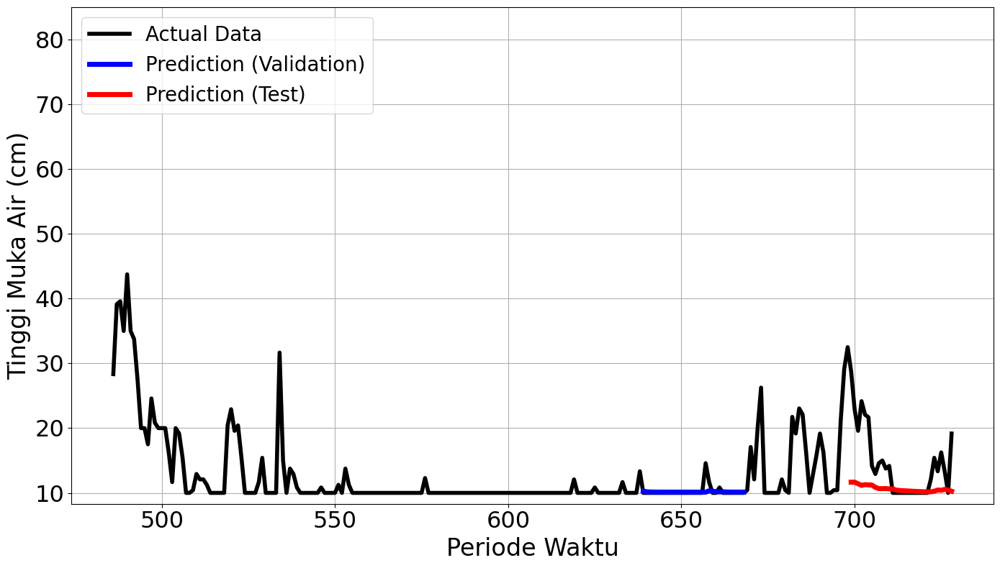

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0713 - val_loss: 0.0221
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0236 - val_loss: 0.0045
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0179 - val_loss: 0.0075
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0215 - val_loss: 0.0101
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0120 - val_loss: 0.0033
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0094 - val_loss: 0.0063
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 0.0148 - val_loss: 0.0064
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0110 - val_loss: 0.0083
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0097 - val_loss: 0.0045
Epoch 10/150
88/93 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0092Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0093 - val_loss: 0.0060
Epoch 00010: early stopping
30/30 ━━━━━━━━

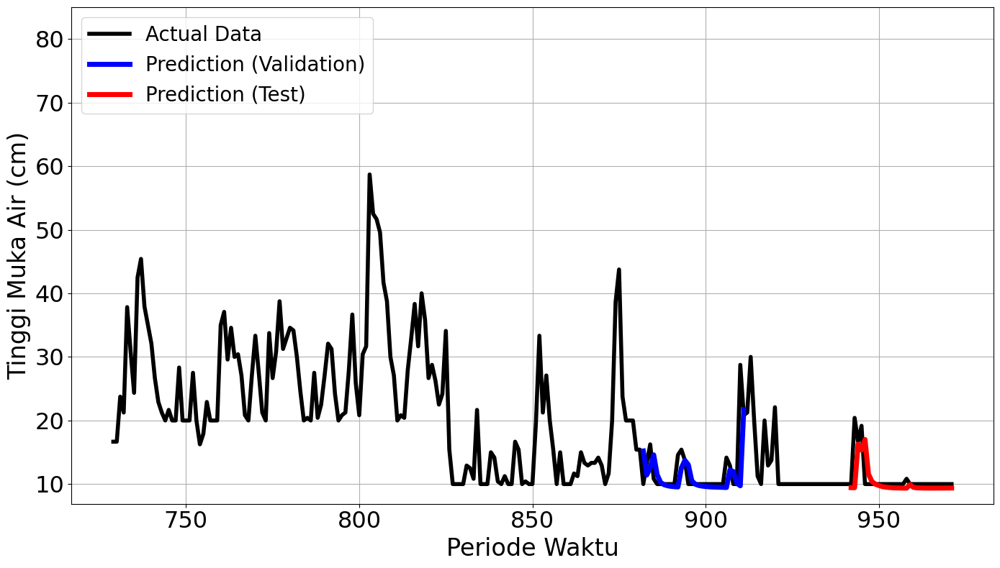

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - loss: 0.0478 - val_loss: 0.0305
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - loss: 0.0139 - val_loss: 0.0178
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0107 - val_loss: 0.0176
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0089 - val_loss: 0.0215
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0083 - val_loss: 0.0156
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0082 - val_loss: 0.0169
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0073 - val_loss: 0.0174
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0072 - val_loss: 0.0153
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0049 - val_loss: 0.0159
Epoch 10/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0082 - val_loss: 0.0138
Epoch 11/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0065 - val_loss: 0.0166
Epoch 12/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0

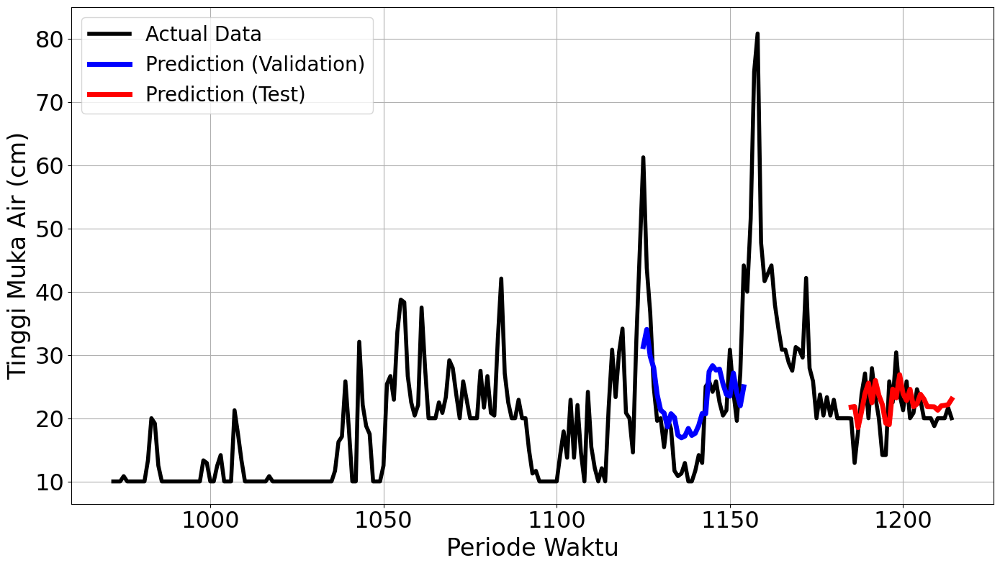

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.1872
Final Average MAPE Test: 0.2047
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - loss: 0.0527 - val_loss: 0.0143
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0055 - val_loss: 0.0217
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0044 - val_loss: 0.0096
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0077 - val_loss: 0.0178
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0057 - val_loss: 0.0129
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0064 - val_loss: 0.0190
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0032 - val_loss: 0.0157
Epoch 8/150
90/93 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0033Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0033 - val_loss: 0.0338
Epoch 00008: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
mape validation = 28.760547192654585 %
mape test = 32.10590154682072 %


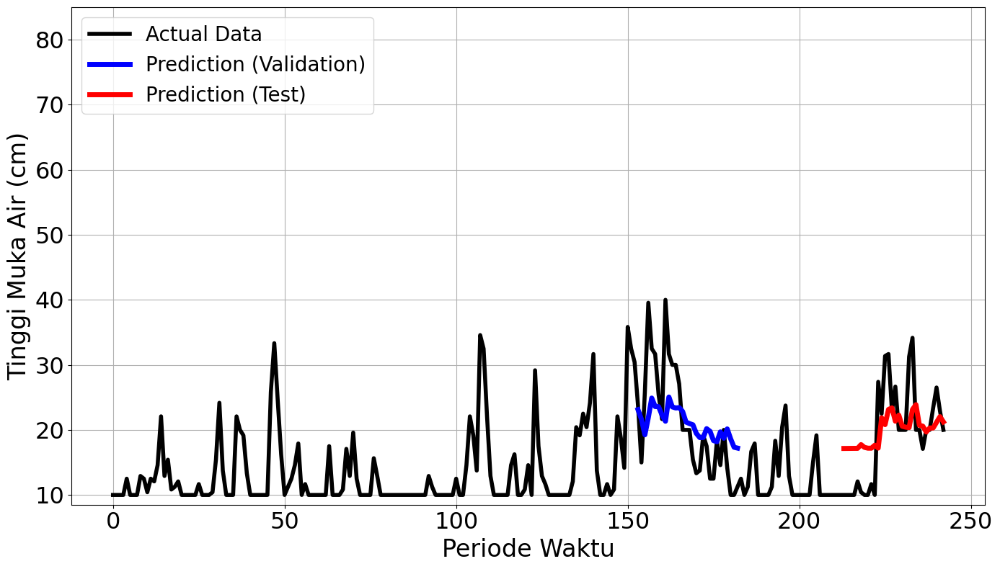

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - loss: 0.0385 - val_loss: 0.0263
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0172 - val_loss: 0.0320
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0153 - val_loss: 0.0319
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0103 - val_loss: 0.0241
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0117 - val_loss: 0.0243
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0081 - val_loss: 0.0185
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0099 - val_loss: 0.0216
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0081 - val_loss: 0.0218
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0118 - val_loss: 0.0183
Epoch 10/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0137 - val_loss: 0.0270
Epoch 11/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0136 - val_loss: 0.0235
Epoch 12/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0

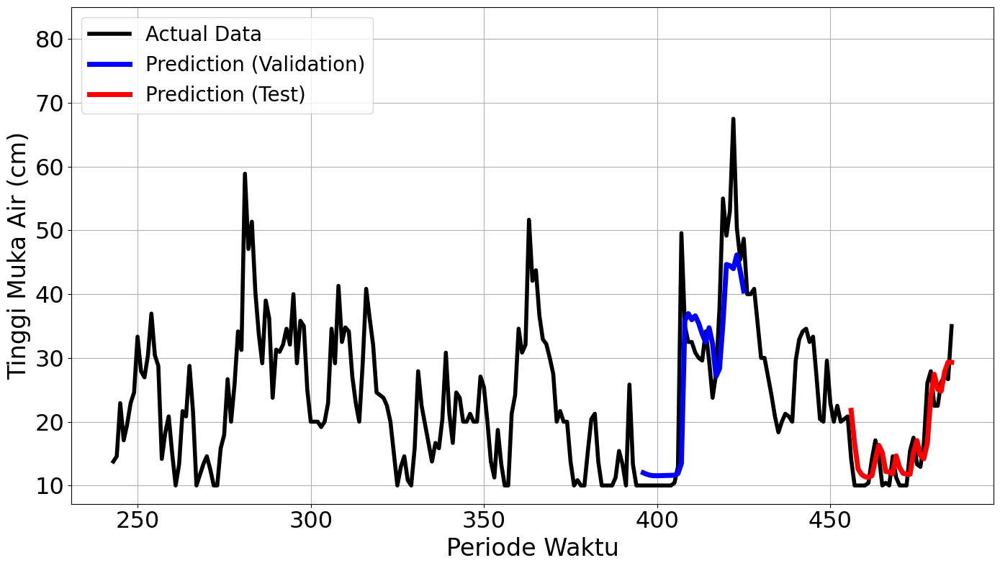

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 0.0257 - val_loss: 9.4088e-04
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.0030 - val_loss: 9.0912e-04
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0060 - val_loss: 5.2689e-04
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0025 - val_loss: 1.9330e-04
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0063 - val_loss: 1.5955e-04
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0013 - val_loss: 1.7820e-04
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0016 - val_loss: 1.7367e-04
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0032 - val_loss: 2.7272e-04
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0035 - val_loss: 1.6944e-04
Epoch 10/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0019 - val_loss: 1.5164e-04
Epoch 11/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0018 - val_loss: 1.9657e-04
Epoch 12/150
93/93 ━

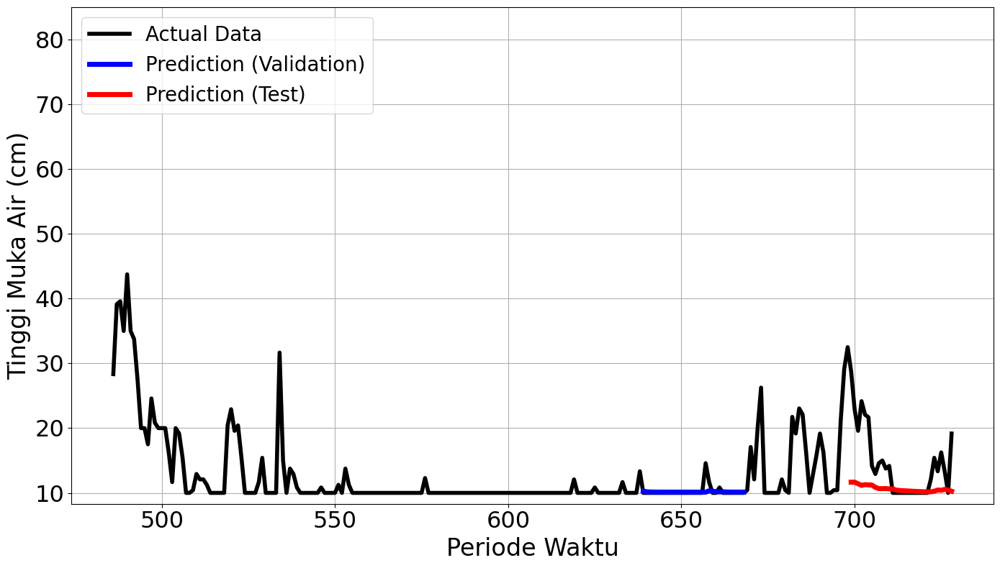

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0713 - val_loss: 0.0221
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0236 - val_loss: 0.0045
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0179 - val_loss: 0.0075
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0215 - val_loss: 0.0101
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0120 - val_loss: 0.0033
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0094 - val_loss: 0.0063
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0148 - val_loss: 0.0064
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0110 - val_loss: 0.0083
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0097 - val_loss: 0.0045
Epoch 10/150
90/93 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0092Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0093 - val_loss: 0.0060
Epoch 00010: early stopping
30/30 ━━━━━━━━

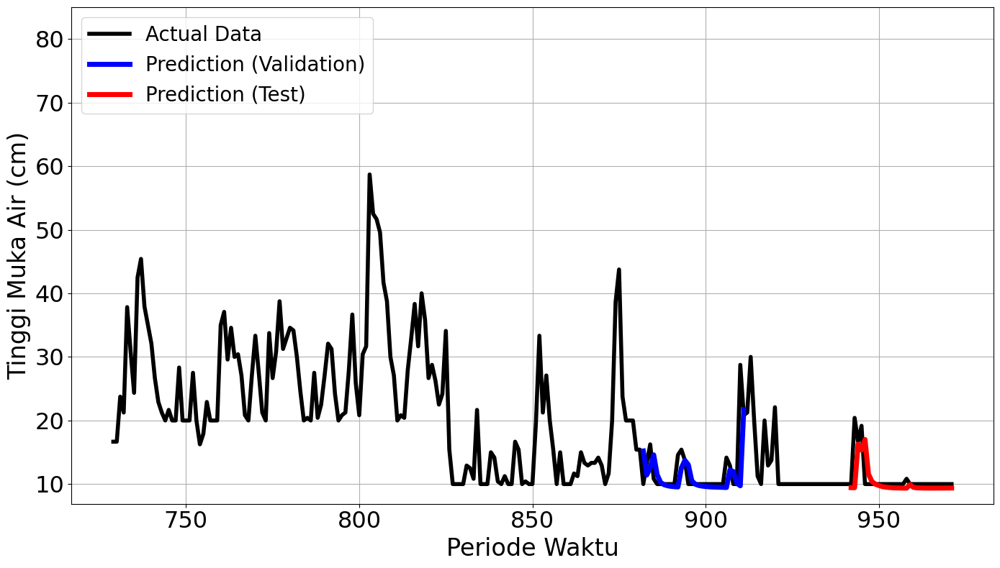

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0478 - val_loss: 0.0305
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0139 - val_loss: 0.0178
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0107 - val_loss: 0.0176
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0089 - val_loss: 0.0215
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0083 - val_loss: 0.0156
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0082 - val_loss: 0.0169
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0073 - val_loss: 0.0174
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0072 - val_loss: 0.0153
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0049 - val_loss: 0.0159
Epoch 10/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0082 - val_loss: 0.0138
Epoch 11/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0065 - val_loss: 0.0166
Epoch 12/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0

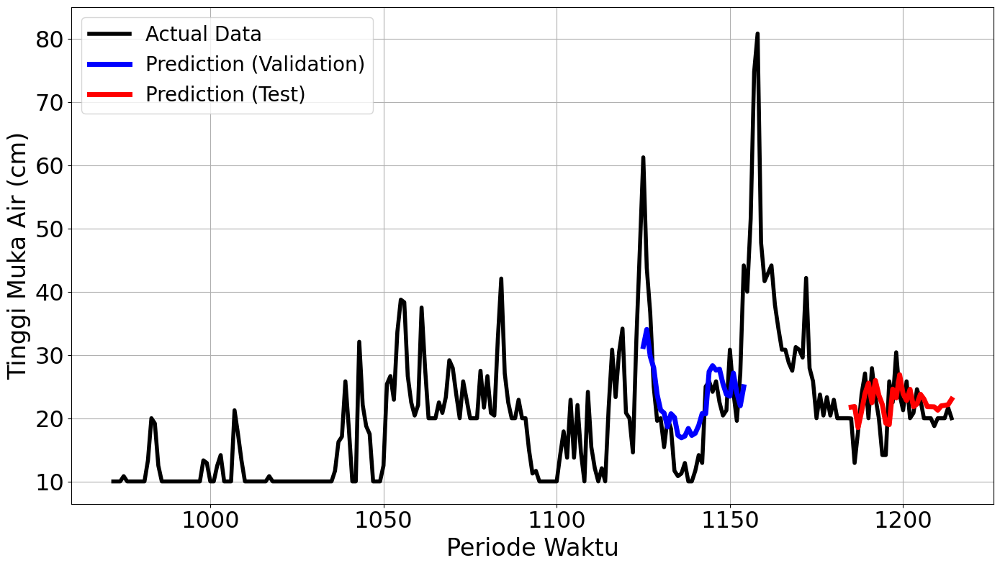

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.1872
Final Average MAPE Test: 0.2047
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 108ms/step - loss: 0.1148 - val_loss: 0.2018
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0371 - val_loss: 0.0764
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0269 - val_loss: 0.0115
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0104 - val_loss: 0.0176
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0104 - val_loss: 0.0129
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0087 - val_loss: 0.0249
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0092 - val_loss: 0.0186
Epoch 8/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0032Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0099 - val_loss: 0.0216
Epoch 00008: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
mape validation = 33.36613899580398 %
mape test = 31.769564438773106 %


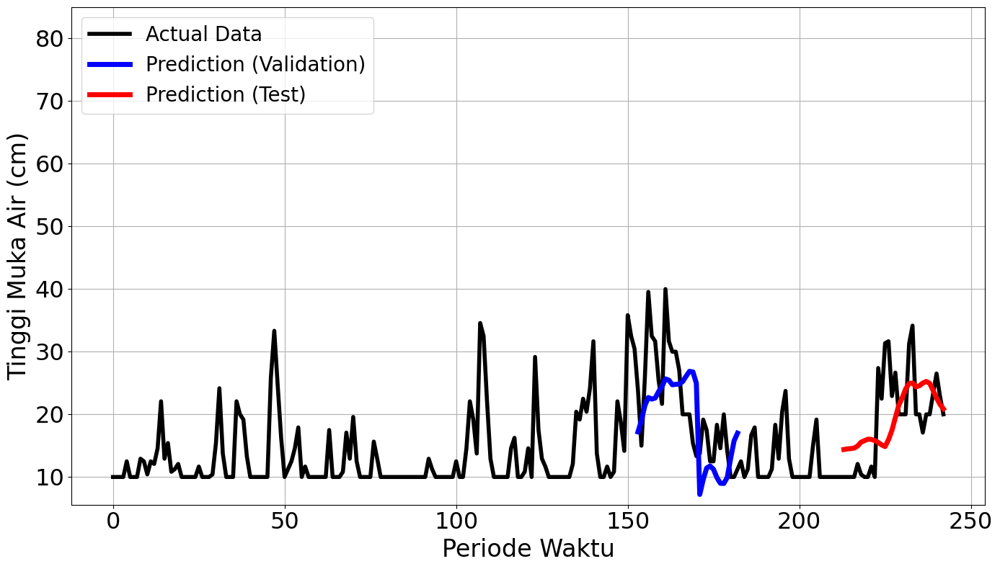

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.0594 - val_loss: 0.0819
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0321 - val_loss: 0.0347
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0308 - val_loss: 0.0450
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0119 - val_loss: 0.0318
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0130 - val_loss: 0.0358
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0181 - val_loss: 0.0282
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0133 - val_loss: 0.0258
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0126 - val_loss: 0.0255
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0172 - val_loss: 0.0257
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0117 - val_loss: 0.0297
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0130 - val_loss: 0.0286
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0093 - val_loss: 0.0221
E

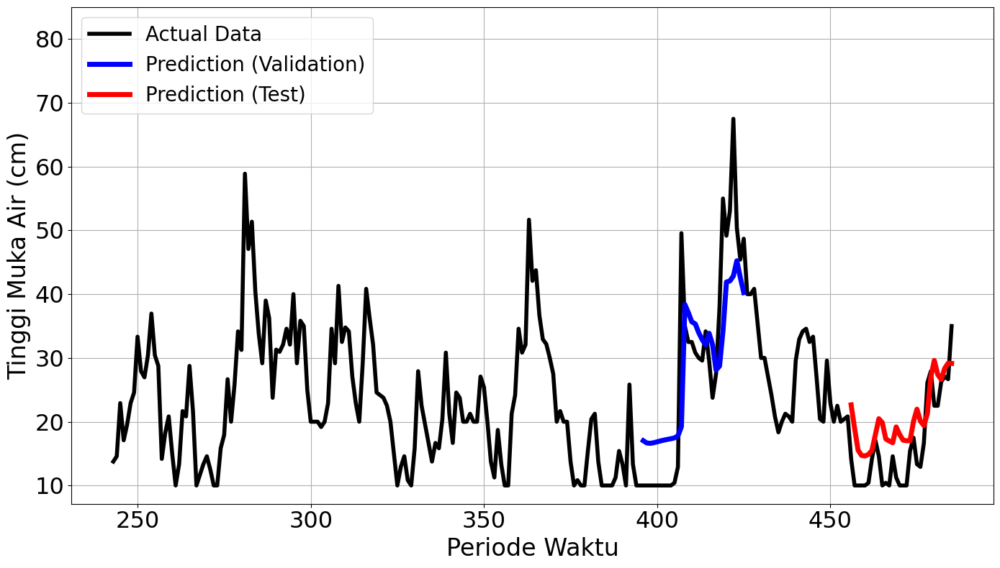

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 288ms/step - loss: 0.0456 - val_loss: 0.0357
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0536 - val_loss: 1.6015e-04
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0260 - val_loss: 0.0010
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0118 - val_loss: 0.0058
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0068 - val_loss: 2.0956e-04
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0058 - val_loss: 0.0021
Epoch 7/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0020Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0031 - val_loss: 2.3165e-04
Epoch 00007: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 251ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
mape validation = 5.262881039480349 %
mape test = 103.43287678524078 %


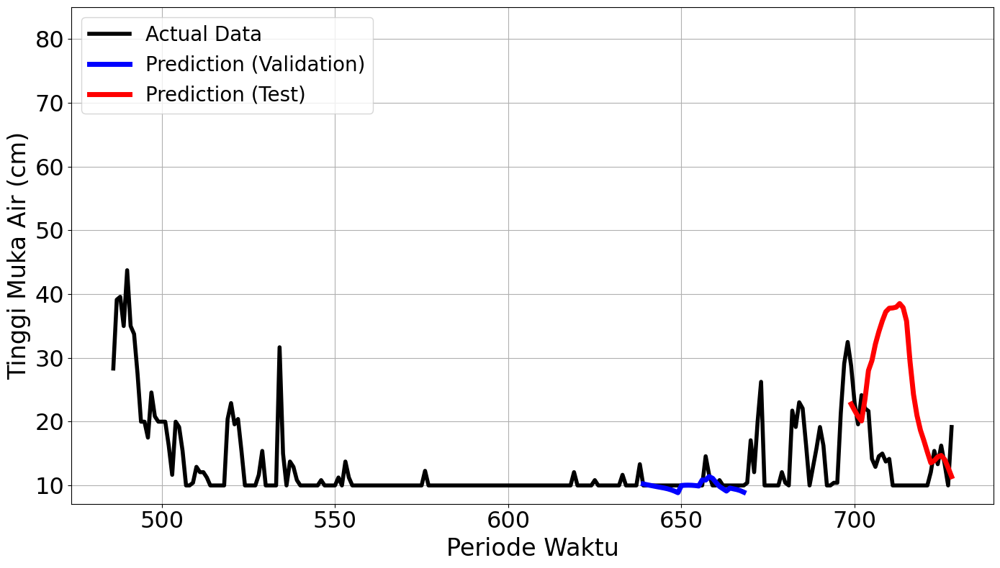

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - loss: 0.1621 - val_loss: 0.0288
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0308 - val_loss: 0.0118
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0149 - val_loss: 0.0044
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0186 - val_loss: 0.0089
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0169 - val_loss: 0.0096
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0159 - val_loss: 0.0104
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0186 - val_loss: 0.0035
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0175 - val_loss: 0.0039
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0121 - val_loss: 0.0031
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0199 - val_loss: 0.0032
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0121 - val_loss: 0.0039
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0096 - val_loss: 0.0032
E

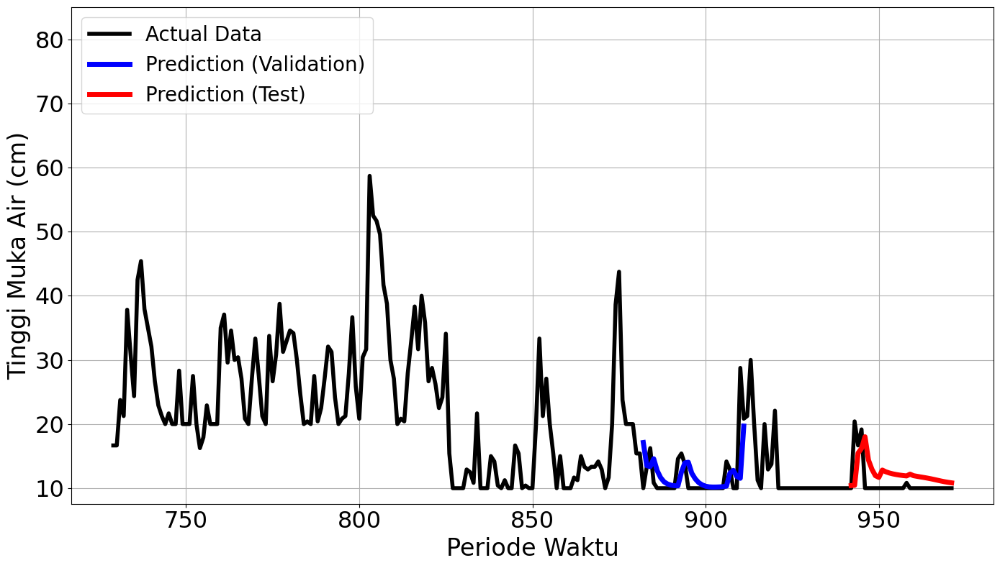

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.0965 - val_loss: 0.1185
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0636 - val_loss: 0.0289
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0116 - val_loss: 0.0259
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0089 - val_loss: 0.0246
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0089 - val_loss: 0.0268
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0112 - val_loss: 0.0254
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0089 - val_loss: 0.0250
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0084 - val_loss: 0.0240
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0106 - val_loss: 0.0228
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0109 - val_loss: 0.0219
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0064 - val_loss: 0.0216
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0060 - val_loss: 0.0209
E

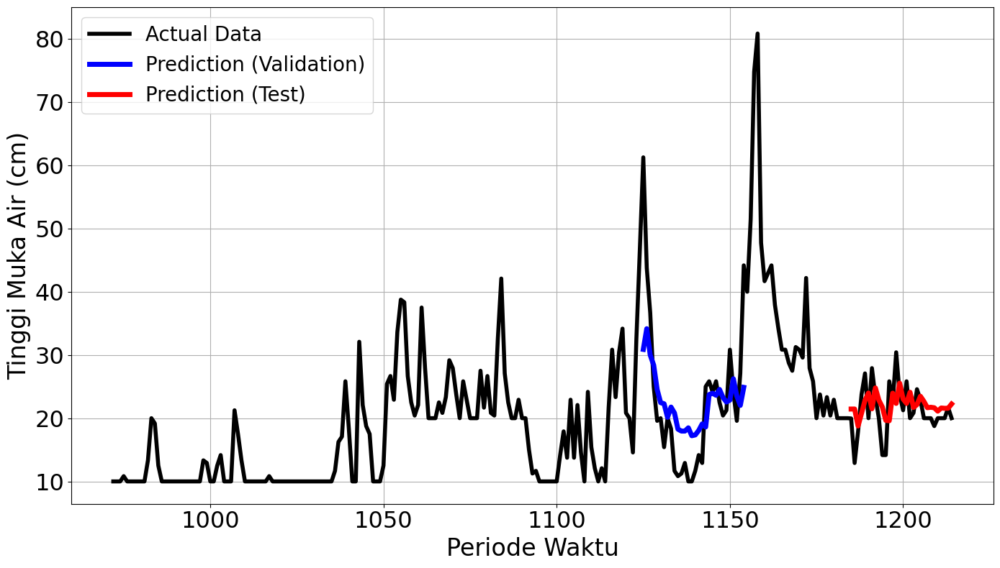

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2440
Final Average MAPE Test: 0.4234
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 135ms/step - loss: 0.1148 - val_loss: 0.2018
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0371 - val_loss: 0.0764
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0269 - val_loss: 0.0115
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0104 - val_loss: 0.0176
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0104 - val_loss: 0.0129
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0087 - val_loss: 0.0249
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0092 - val_loss: 0.0186
Epoch 8/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step - loss: 0.0032Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0099 - val_loss: 0.0216
Epoch 00008: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
mape validation = 33.36613899580398 %
mape test = 31.769564438773106 %


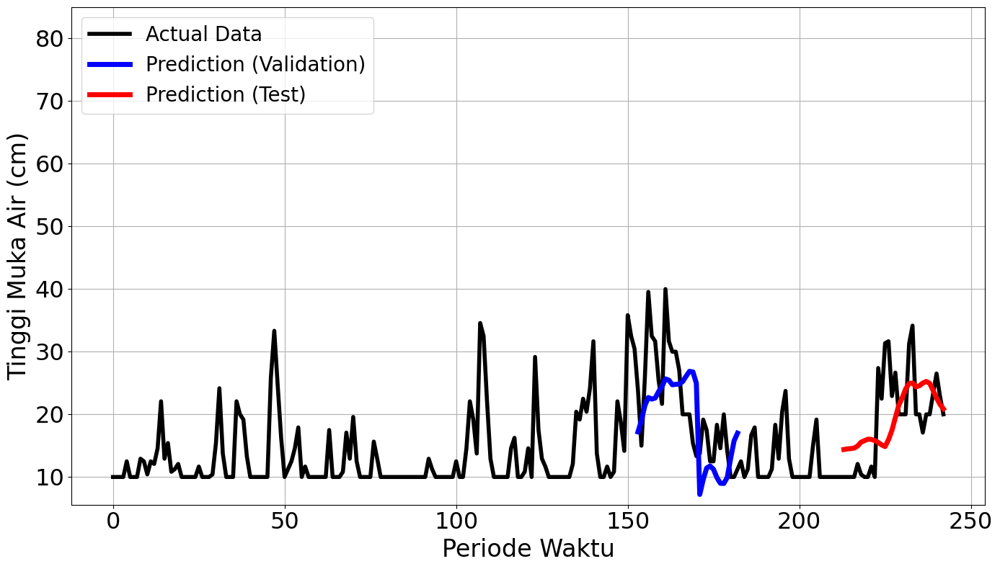

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 85ms/step - loss: 0.0594 - val_loss: 0.0819
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0321 - val_loss: 0.0347
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0308 - val_loss: 0.0450
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0119 - val_loss: 0.0318
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0130 - val_loss: 0.0358
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0181 - val_loss: 0.0282
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0133 - val_loss: 0.0258
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0126 - val_loss: 0.0255
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0172 - val_loss: 0.0257
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0117 - val_loss: 0.0297
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0130 - val_loss: 0.0286
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0093 - val_loss: 0.0221
E

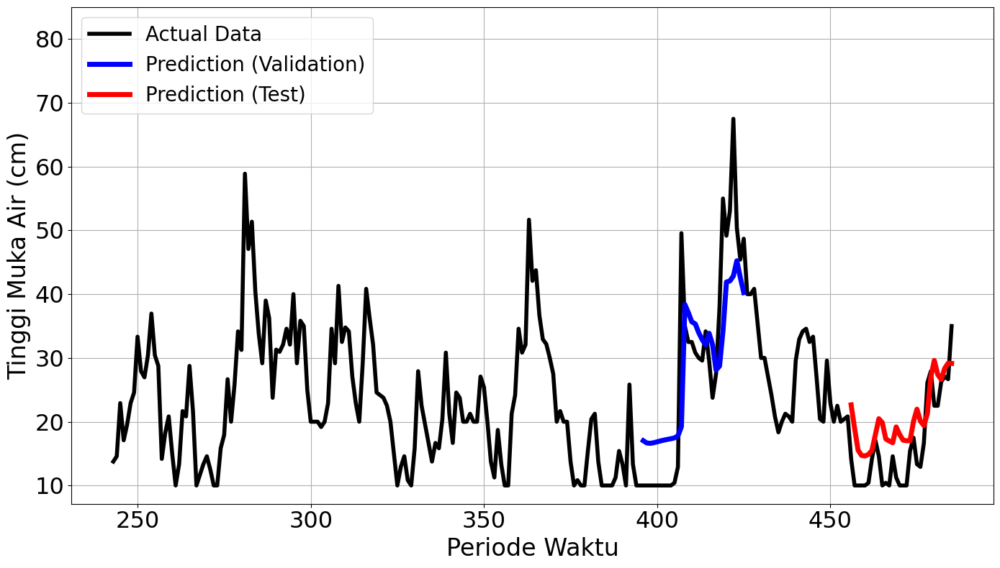

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.0456 - val_loss: 0.0357
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0536 - val_loss: 1.6015e-04
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0260 - val_loss: 0.0010
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0118 - val_loss: 0.0058
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0068 - val_loss: 2.0956e-04
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0058 - val_loss: 0.0021
Epoch 7/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step - loss: 0.0020Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0031 - val_loss: 2.3165e-04
Epoch 00007: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
mape validation = 5.262881039480349 %
mape test = 103.43287678524078 %


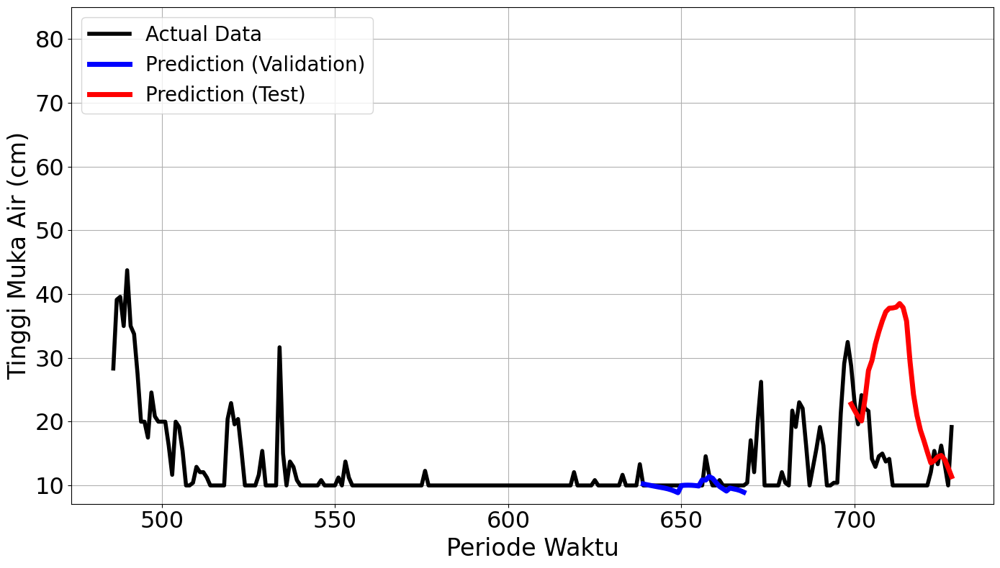

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.1621 - val_loss: 0.0288
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0308 - val_loss: 0.0118
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0149 - val_loss: 0.0044
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0186 - val_loss: 0.0089
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0169 - val_loss: 0.0096
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0159 - val_loss: 0.0104
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0186 - val_loss: 0.0035
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0175 - val_loss: 0.0039
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0121 - val_loss: 0.0031
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0199 - val_loss: 0.0032
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0121 - val_loss: 0.0039
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0096 - val_loss: 0.0032
E

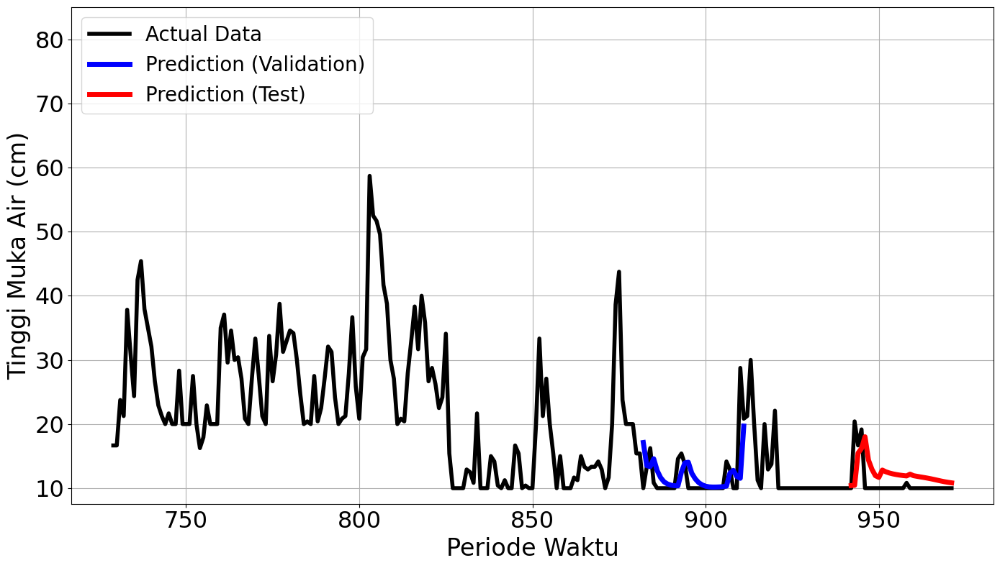

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.0965 - val_loss: 0.1185
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0636 - val_loss: 0.0289
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0116 - val_loss: 0.0259
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0089 - val_loss: 0.0246
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0089 - val_loss: 0.0268
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0112 - val_loss: 0.0254
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0089 - val_loss: 0.0250
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0084 - val_loss: 0.0240
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0106 - val_loss: 0.0228
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0109 - val_loss: 0.0219
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0064 - val_loss: 0.0216
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0060 - val_loss: 0.0209


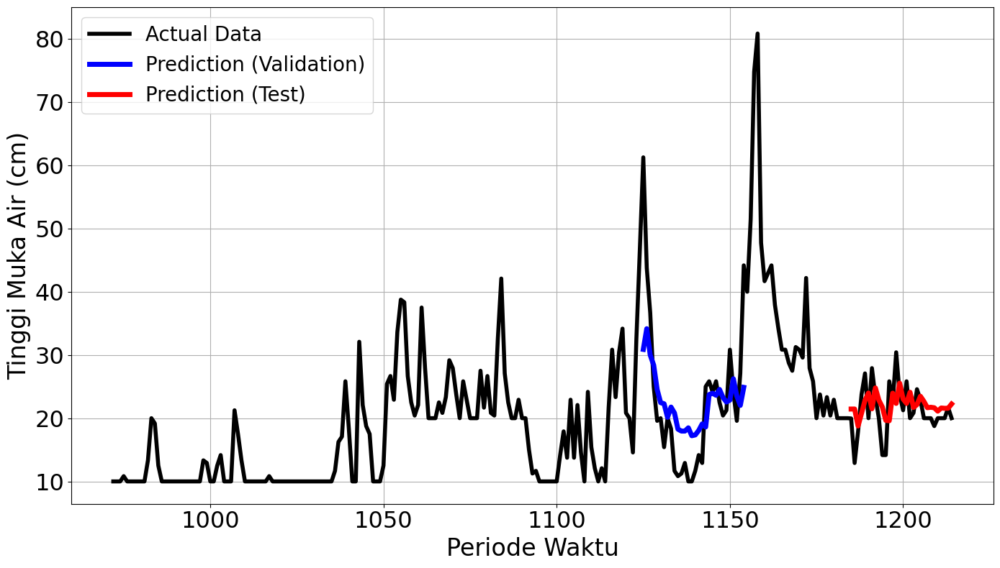

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2440
Final Average MAPE Test: 0.4234
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 563ms/step - loss: 0.2017 - val_loss: 0.1516
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.0277 - val_loss: 0.0814
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.0256 - val_loss: 0.0607
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0127 - val_loss: 0.0842
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - loss: 0.0142 - val_loss: 0.0970
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.0085 - val_loss: 0.0752
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0123 - val_loss: 0.0654
Epoch 8/150
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0068Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0072 - val_loss: 0.0615
Epoch 00008: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
mape validation = 58.67222293067867 %
mape test = 32.17720079913021 %


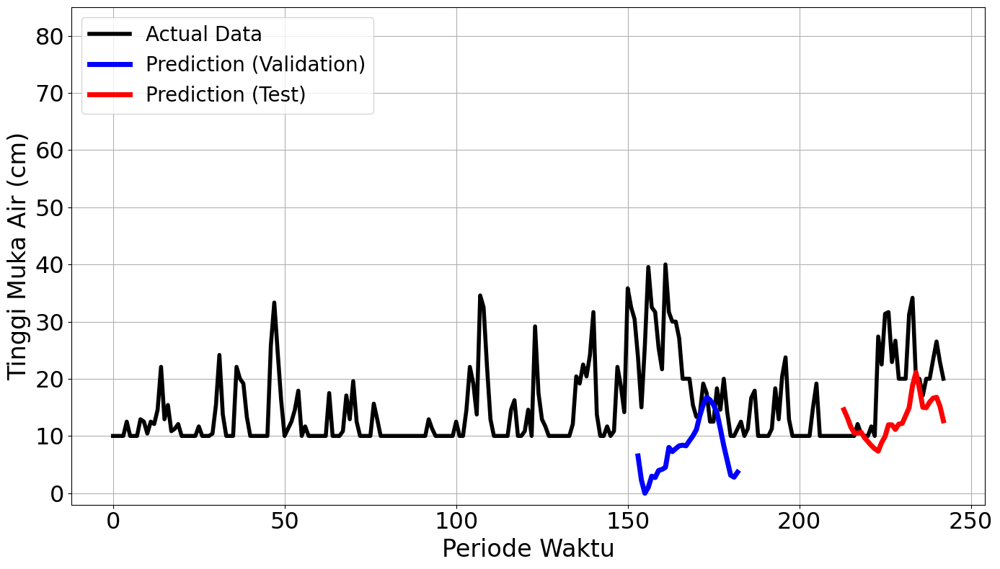

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 519ms/step - loss: 0.0525 - val_loss: 0.0620
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0503 - val_loss: 0.0657
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0407 - val_loss: 0.0474
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0334 - val_loss: 0.0405
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0263 - val_loss: 0.0519
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0254 - val_loss: 0.0426
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0202 - val_loss: 0.0376
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0170 - val_loss: 0.0365
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0199 - val_loss: 0.0366
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0172 - val_loss: 0.0393
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0175 - val_loss: 0.0354
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0234 - val_loss: 0.0310


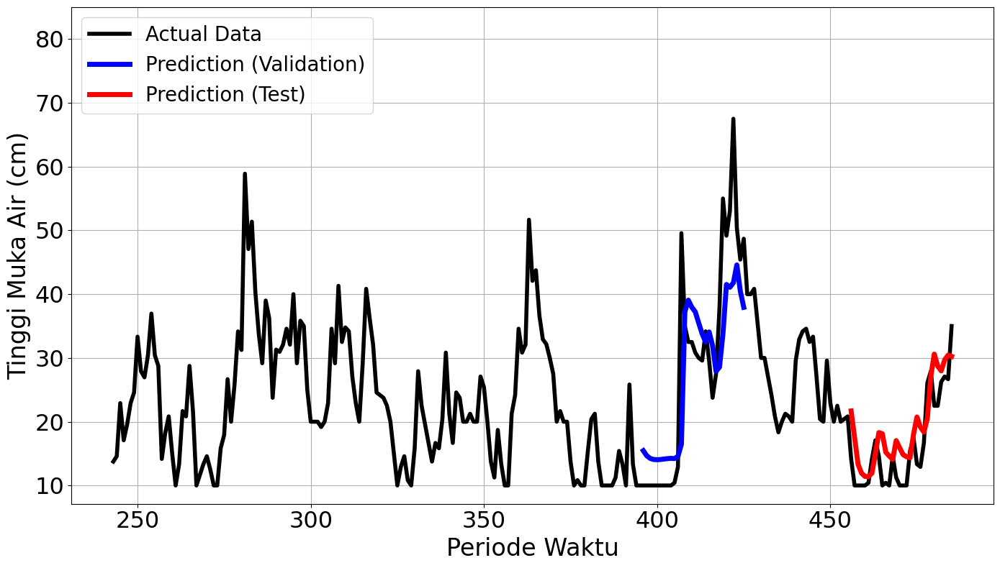

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 657ms/step - loss: 0.1999 - val_loss: 0.0090
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 114ms/step - loss: 0.0564 - val_loss: 0.0101
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.0108 - val_loss: 0.0076
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0112 - val_loss: 0.0018
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0132 - val_loss: 0.0036
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0058 - val_loss: 0.0159
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0059 - val_loss: 0.0022
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0044 - val_loss: 0.0022
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0028 - val_loss: 0.0011
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0051 - val_loss: 0.0013
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0025 - val_loss: 4.9672e-04
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0030 - val_loss: 0

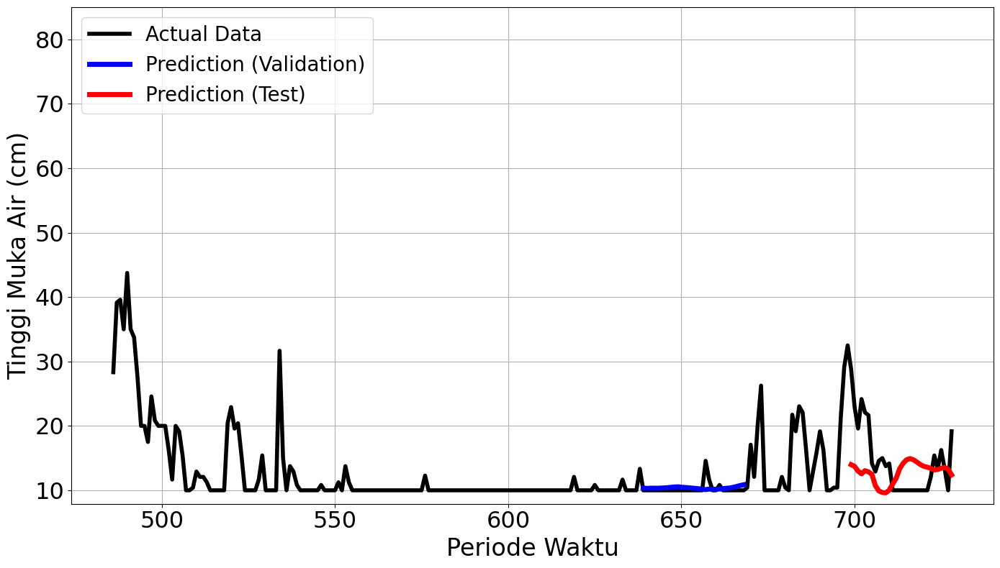

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 492ms/step - loss: 0.1562 - val_loss: 0.3098
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.1682 - val_loss: 0.0215
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0217 - val_loss: 0.0197
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0225 - val_loss: 0.0141
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0218 - val_loss: 0.0060
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.0141 - val_loss: 0.0059
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0156 - val_loss: 0.0067
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0143 - val_loss: 0.0043
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0153 - val_loss: 0.0041
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0176 - val_loss: 0.0040
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0136 - val_loss: 0.0042
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0167 - val_loss: 0.0068

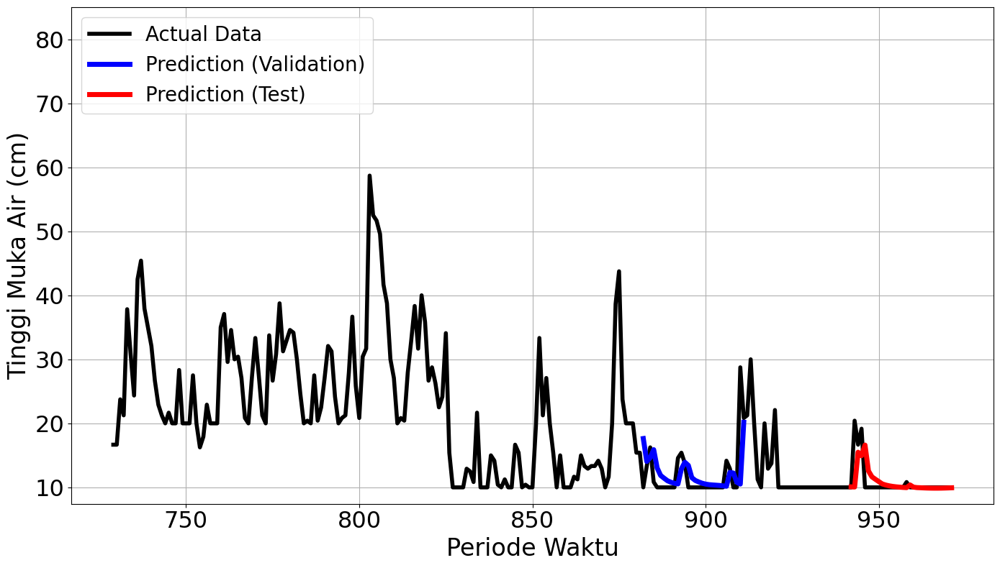

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 480ms/step - loss: 0.1187 - val_loss: 0.0562
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0266 - val_loss: 0.1441
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1701 - val_loss: 0.0469
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0145 - val_loss: 0.0658
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0249 - val_loss: 0.0361
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0093 - val_loss: 0.0237
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0104 - val_loss: 0.0226
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0123 - val_loss: 0.0221
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0066 - val_loss: 0.0225
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0103 - val_loss: 0.0221
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.0076 - val_loss: 0.0212
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0091 - val_loss: 0.0206

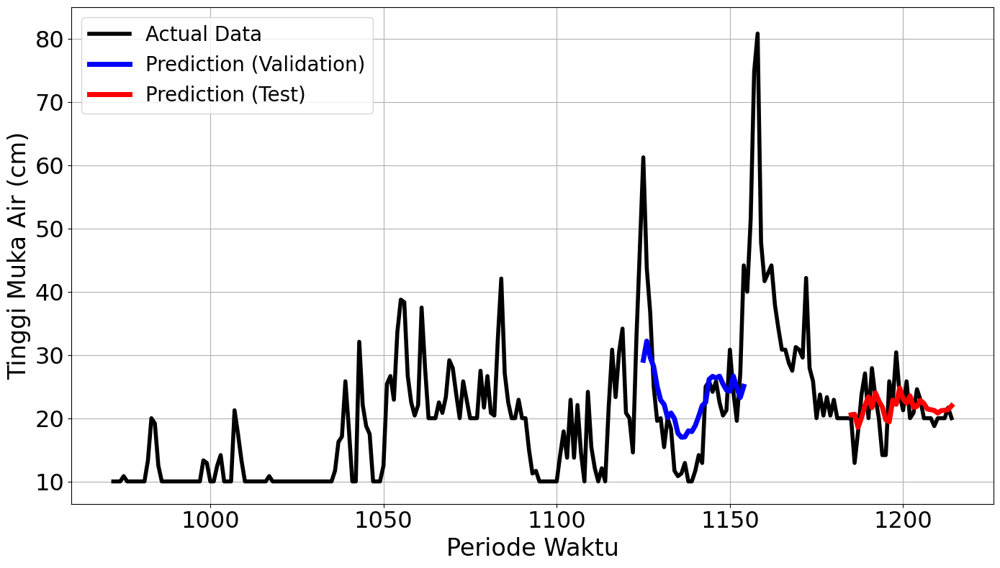

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2810
Final Average MAPE Test: 0.2309
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 503ms/step - loss: 0.2017 - val_loss: 0.1516
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0277 - val_loss: 0.0814
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0256 - val_loss: 0.0607
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0127 - val_loss: 0.0842
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0142 - val_loss: 0.0970
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0085 - val_loss: 0.0752
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0123 - val_loss: 0.0654
Epoch 8/150
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0068Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.0072 - val_loss: 0.0615
Epoch 00008: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
mape validation = 58.67222293067867 %
mape test = 32.17720079913021 %


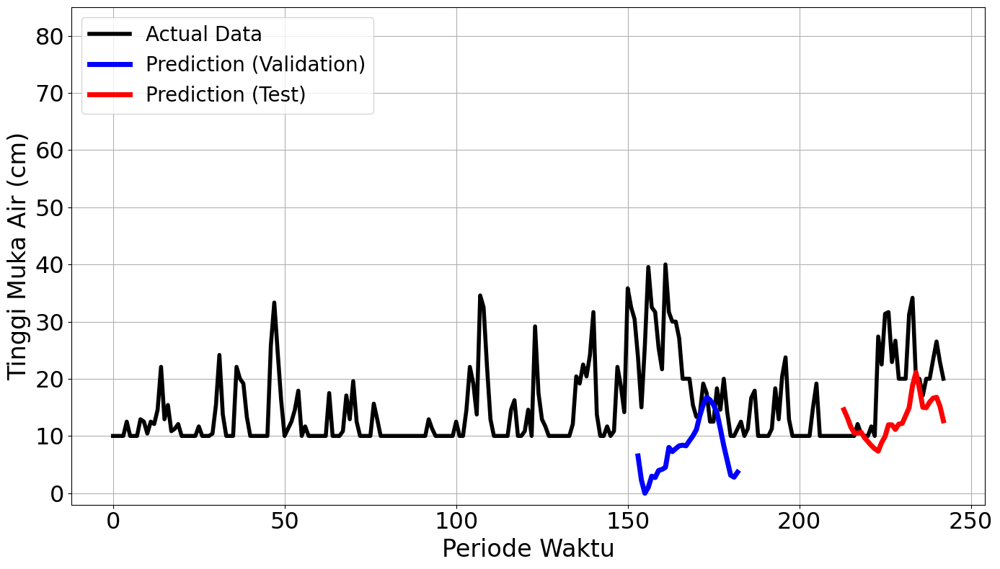

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 510ms/step - loss: 0.0525 - val_loss: 0.0620
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0503 - val_loss: 0.0657
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0407 - val_loss: 0.0474
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0334 - val_loss: 0.0405
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0263 - val_loss: 0.0519
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0254 - val_loss: 0.0426
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0202 - val_loss: 0.0376
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0170 - val_loss: 0.0365
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0199 - val_loss: 0.0366
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0172 - val_loss: 0.0393
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0175 - val_loss: 0.0354
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0234 - val_loss: 0.0310


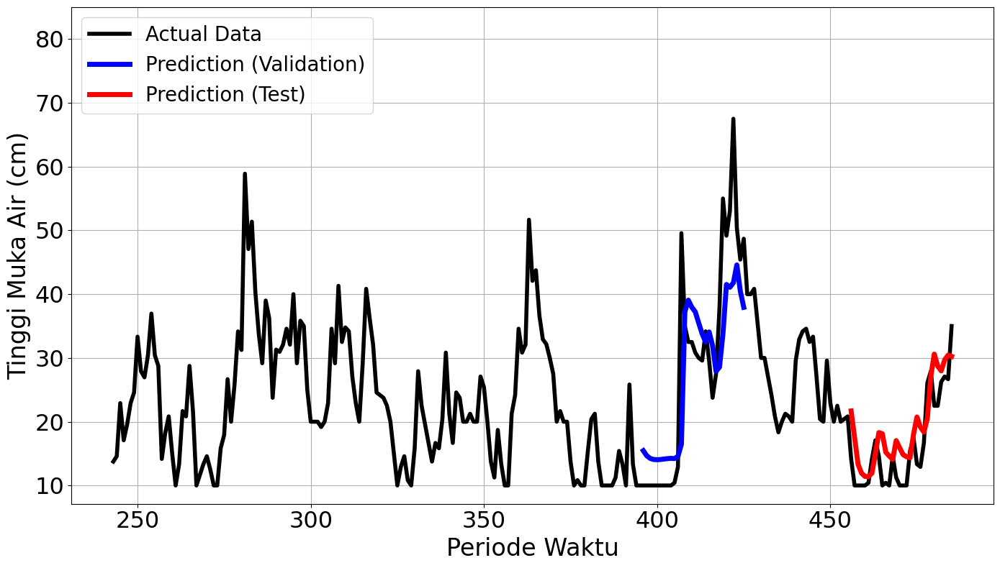

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 491ms/step - loss: 0.1999 - val_loss: 0.0090
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0564 - val_loss: 0.0101
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0108 - val_loss: 0.0076
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0112 - val_loss: 0.0018
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0132 - val_loss: 0.0036
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0058 - val_loss: 0.0159
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0059 - val_loss: 0.0022
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0044 - val_loss: 0.0022
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0028 - val_loss: 0.0011
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0051 - val_loss: 0.0013
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0025 - val_loss: 4.9672e-04
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0030 - val_loss: 0.0

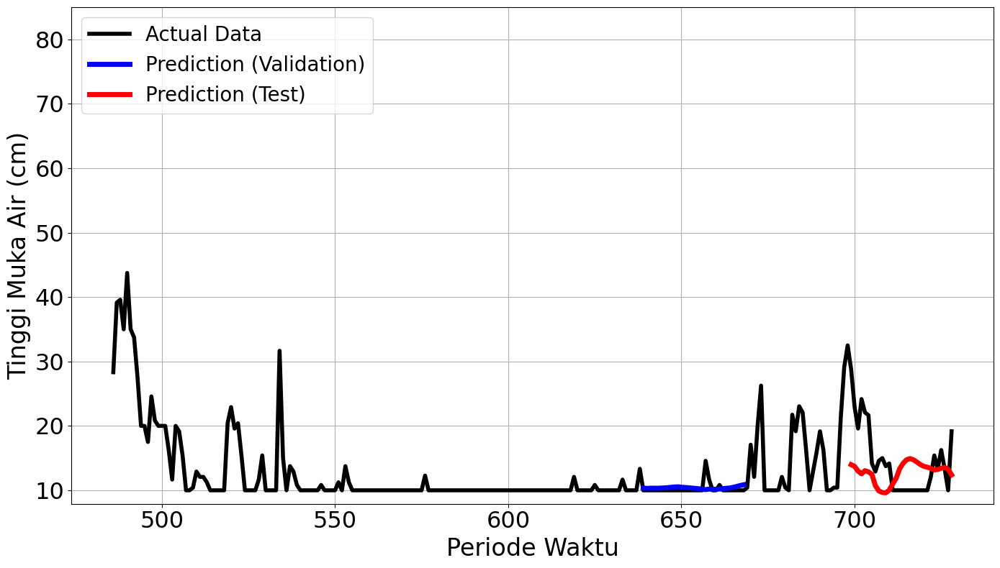

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 507ms/step - loss: 0.1562 - val_loss: 0.3098
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.1682 - val_loss: 0.0215
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0217 - val_loss: 0.0197
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0225 - val_loss: 0.0141
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0218 - val_loss: 0.0060
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0141 - val_loss: 0.0059
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0156 - val_loss: 0.0067
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0143 - val_loss: 0.0043
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0153 - val_loss: 0.0041
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0176 - val_loss: 0.0040
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0136 - val_loss: 0.0042
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0167 - val_loss: 0.0068


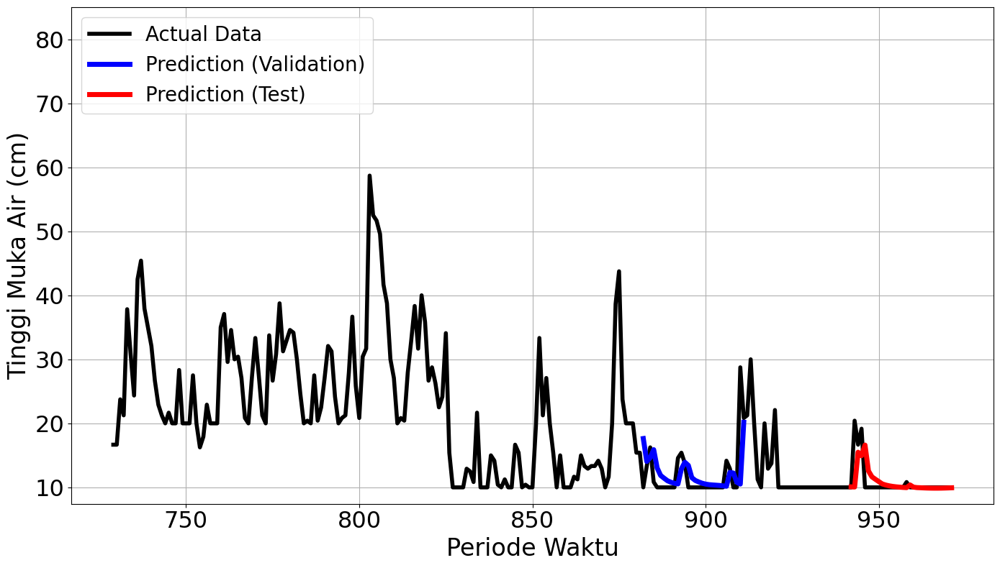

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 452ms/step - loss: 0.1187 - val_loss: 0.0562
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0266 - val_loss: 0.1441
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.1701 - val_loss: 0.0469
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0145 - val_loss: 0.0658
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0249 - val_loss: 0.0361
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0093 - val_loss: 0.0237
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0104 - val_loss: 0.0226
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0123 - val_loss: 0.0221
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0066 - val_loss: 0.0225
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0103 - val_loss: 0.0221
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0076 - val_loss: 0.0212
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0091 - val_loss: 0.0206


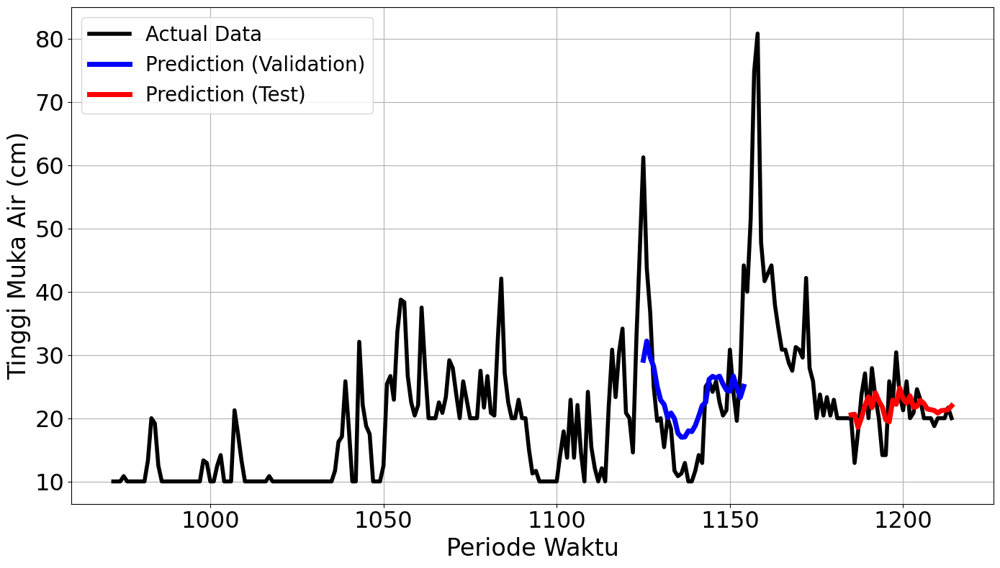

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2810
Final Average MAPE Test: 0.2309
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.1945 - val_loss: 0.1936
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step - loss: 0.0351 - val_loss: 0.1596
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0214 - val_loss: 0.1038
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0138 - val_loss: 0.0705
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - loss: 0.0112 - val_loss: 0.0634
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.0087 - val_loss: 0.0650
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.0078 - val_loss: 0.0654
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0087 - val_loss: 0.0603
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.0073 - val_loss: 0.0509
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0069 - val_loss: 0.0414
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.0078 - val_loss: 0.0341
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0056 - val_loss: 0.

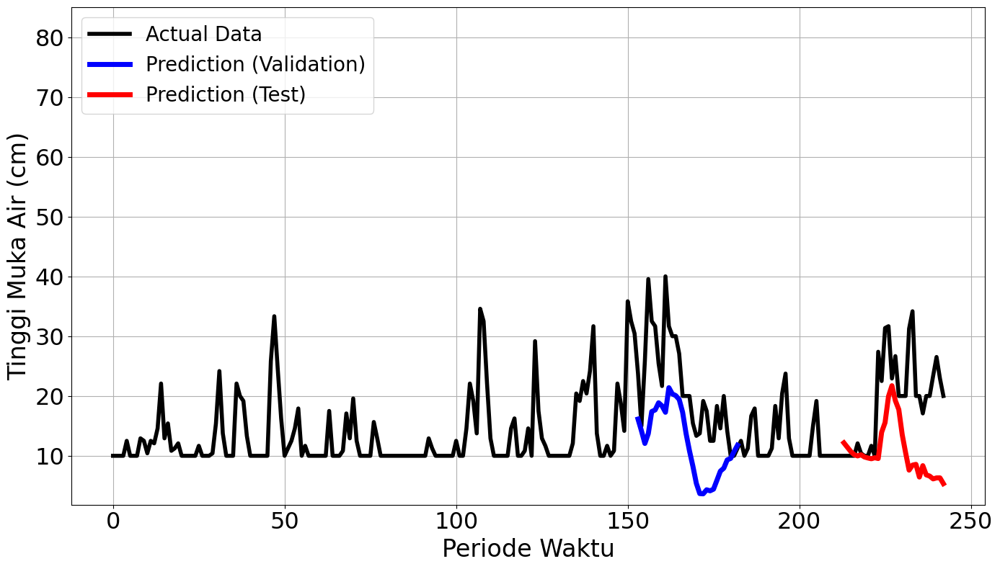

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.0421 - val_loss: 0.2494
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.1555 - val_loss: 0.0668
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0808 - val_loss: 0.0335
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - loss: 0.0290 - val_loss: 0.0395
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.0236 - val_loss: 0.0416
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - loss: 0.0229 - val_loss: 0.0424
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0162 - val_loss: 0.0434
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step - loss: 0.0206Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step - loss: 0.0206 - val_loss: 0.0436
Epoch 00008: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
mape validation = 49.87109453944931 %
mape test = 28.591405327708426 %


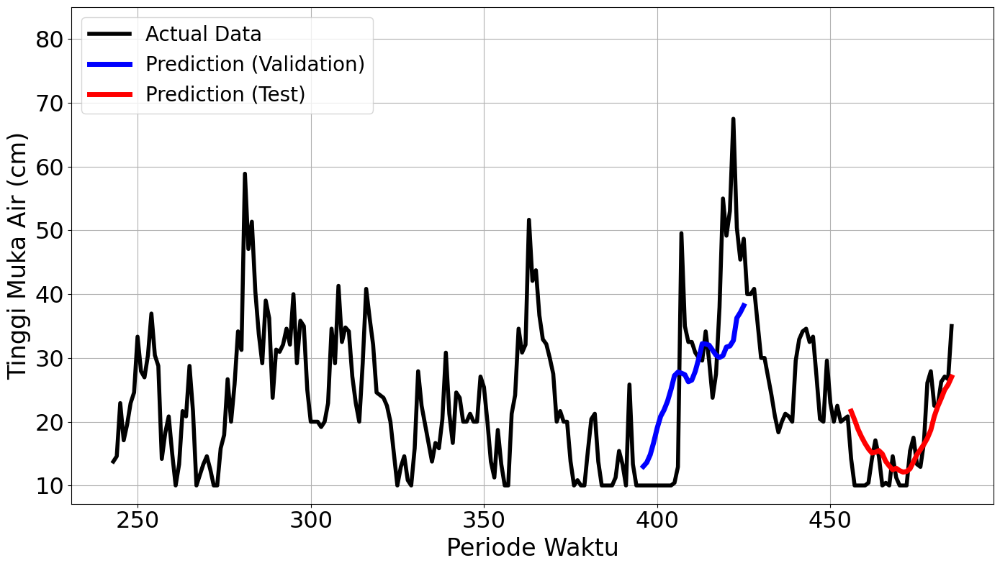

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.1632 - val_loss: 0.0537
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0561 - val_loss: 0.0047
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0130 - val_loss: 0.0213
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - loss: 0.0186 - val_loss: 0.0018
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0051 - val_loss: 0.0051
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.0068 - val_loss: 0.0109
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0092 - val_loss: 0.0038
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step - loss: 0.0077 - val_loss: 9.4620e-04
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - loss: 0.0061 - val_loss: 0.0099
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.0072 - val_loss: 0.0106
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0088 - val_loss: 0.0020
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - loss: 0.0033 - val_loss:

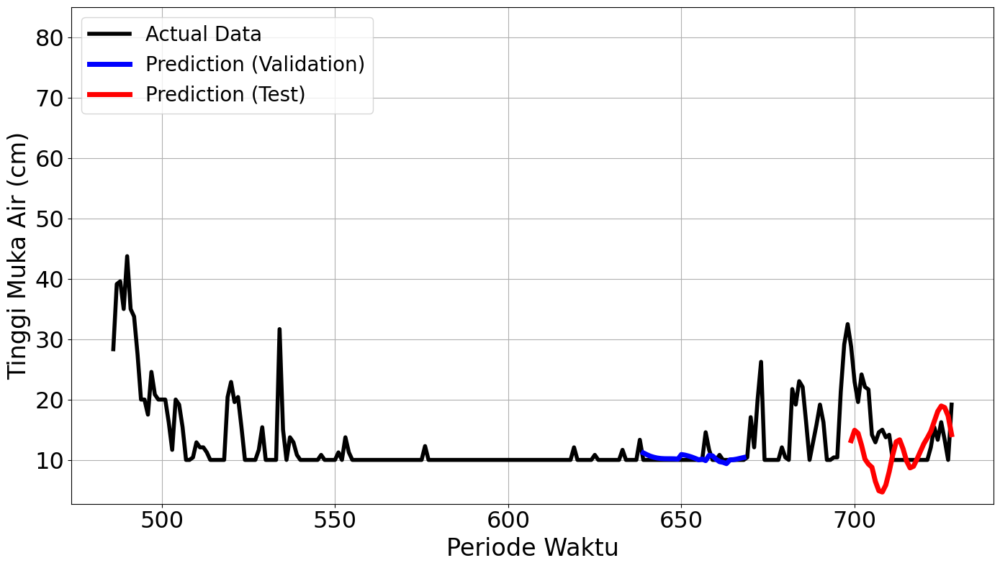

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.1128 - val_loss: 0.1658
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step - loss: 0.1406 - val_loss: 0.1133
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0863 - val_loss: 0.0055
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 0.0297 - val_loss: 0.0078
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.0262 - val_loss: 0.0104
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.0223 - val_loss: 0.0106
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0181 - val_loss: 0.0103
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0183Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - loss: 0.0183 - val_loss: 0.0088
Epoch 00008: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
mape validation = 38.695493930296806 %
mape test = 105.89631629601574 %


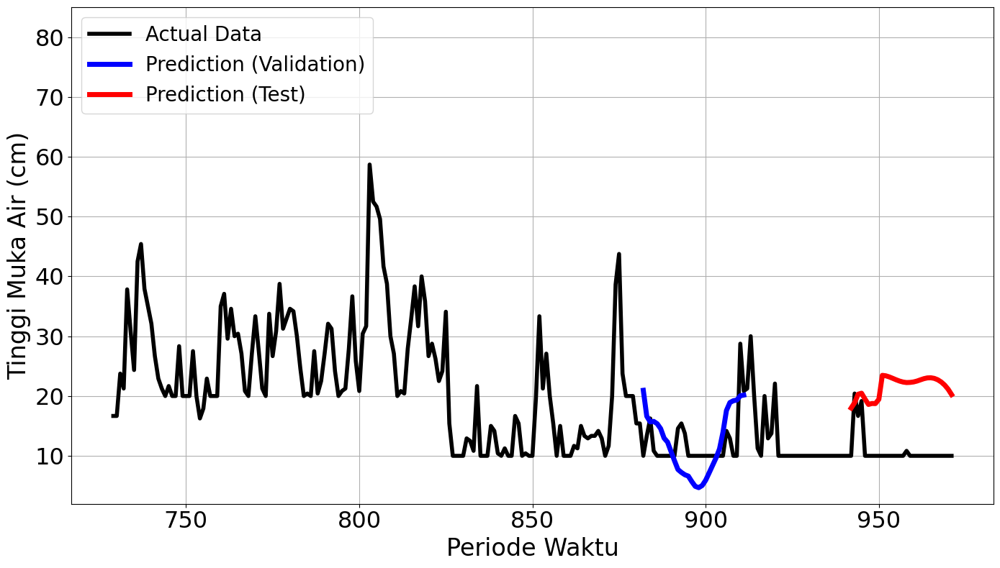

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.1288 - val_loss: 0.0575
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 771ms/step - loss: 0.0388 - val_loss: 0.0408
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step - loss: 0.0230 - val_loss: 0.0284
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.0106 - val_loss: 0.0278
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.0154 - val_loss: 0.0334
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.0157 - val_loss: 0.0301
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - loss: 0.0113 - val_loss: 0.0342
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - loss: 0.0099 - val_loss: 0.0448
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0093Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0093 - val_loss: 0.0564
Epoch 00009: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
mape validation = 31.236153486304357 %

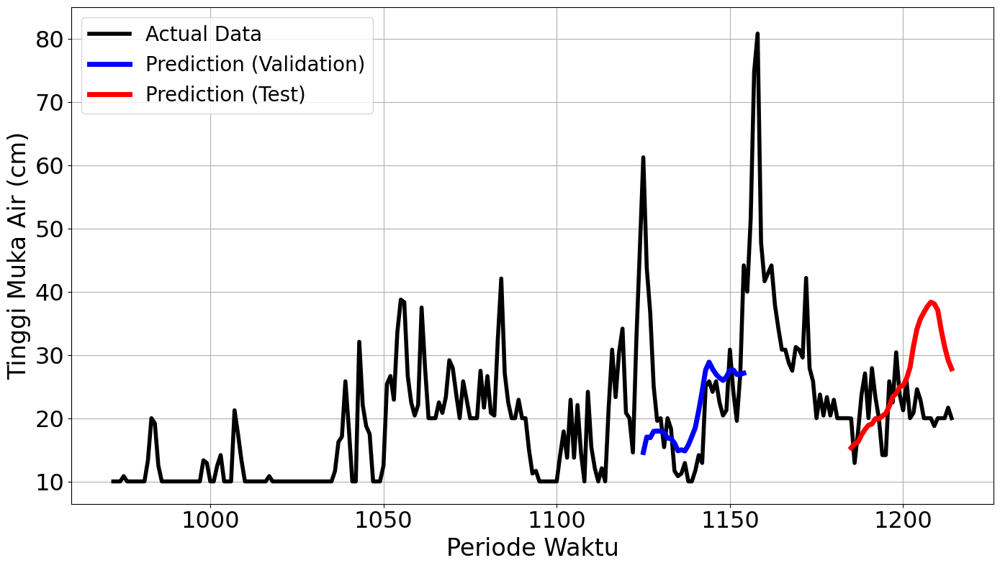

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.3337
Final Average MAPE Test: 0.4914
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.1945 - val_loss: 0.1936
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step - loss: 0.0351 - val_loss: 0.1596
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.0214 - val_loss: 0.1038
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0138 - val_loss: 0.0705
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.0112 - val_loss: 0.0634
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step - loss: 0.0087 - val_loss: 0.0650
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0078 - val_loss: 0.0654
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - loss: 0.0087 - val_loss: 0.0603
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - loss: 0.0073 - val_loss: 0.0509
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0069 - val_loss: 0.0414
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0078 - val_loss: 0.0341
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0056 - val_loss: 0

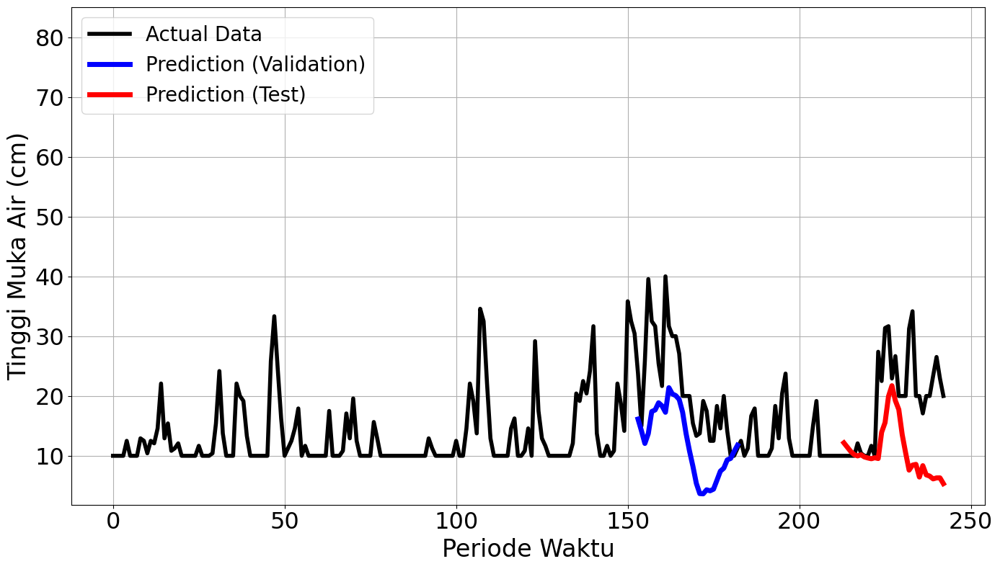

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.0421 - val_loss: 0.2494
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1555 - val_loss: 0.0668
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0808 - val_loss: 0.0335
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.0290 - val_loss: 0.0395
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - loss: 0.0236 - val_loss: 0.0416
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 0.0229 - val_loss: 0.0424
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.0162 - val_loss: 0.0434
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0206Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step - loss: 0.0206 - val_loss: 0.0436
Epoch 00008: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
mape validation = 49.87109453944931 %
mape test = 28.591405327708426 %


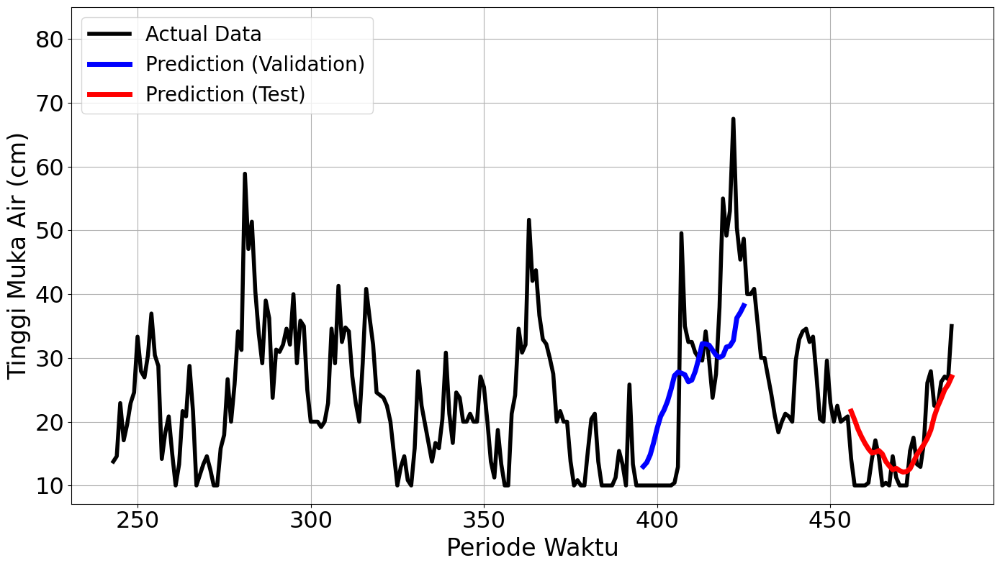

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.1632 - val_loss: 0.0537
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step - loss: 0.0561 - val_loss: 0.0047
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - loss: 0.0130 - val_loss: 0.0213
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0186 - val_loss: 0.0018
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.0051 - val_loss: 0.0051
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.0068 - val_loss: 0.0109
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 0.0092 - val_loss: 0.0038
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0077 - val_loss: 9.4620e-04
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 0.0061 - val_loss: 0.0099
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0072 - val_loss: 0.0106
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0088 - val_loss: 0.0020
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0033 - val_los

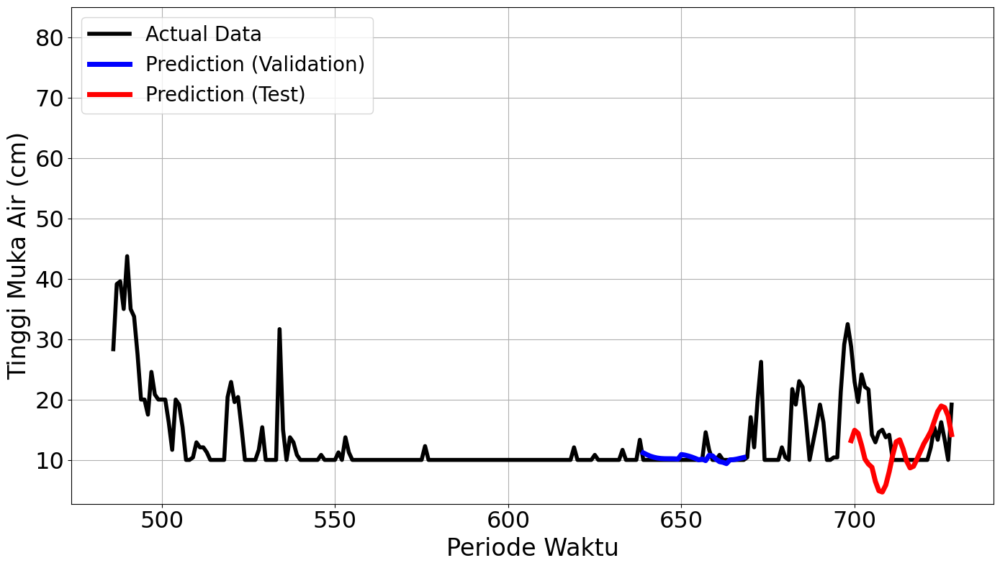

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.1128 - val_loss: 0.1658
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.1406 - val_loss: 0.1133
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - loss: 0.0863 - val_loss: 0.0055
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0297 - val_loss: 0.0078
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - loss: 0.0262 - val_loss: 0.0104
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step - loss: 0.0223 - val_loss: 0.0106
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0181 - val_loss: 0.0103
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0183Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - loss: 0.0183 - val_loss: 0.0088
Epoch 00008: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
mape validation = 38.695493930296806 %
mape test = 105.89631629601574 %


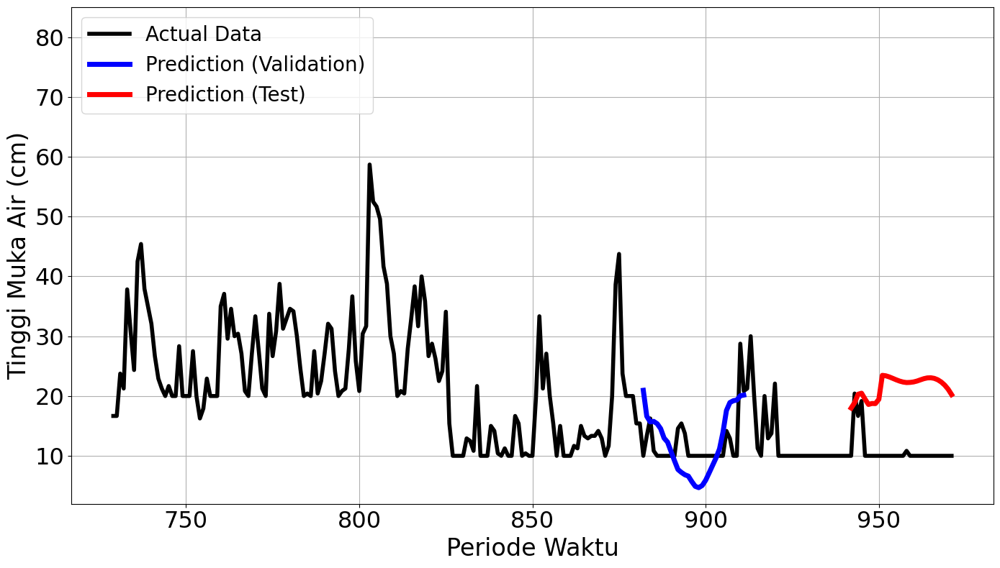

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - loss: 0.1288 - val_loss: 0.0575
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - loss: 0.0388 - val_loss: 0.0408
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0230 - val_loss: 0.0284
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.0106 - val_loss: 0.0278
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0154 - val_loss: 0.0334
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0157 - val_loss: 0.0301
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0113 - val_loss: 0.0342
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0099 - val_loss: 0.0448
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0093Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - loss: 0.0093 - val_loss: 0.0564
Epoch 00009: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
mape validation = 31.236153486304357 %
m

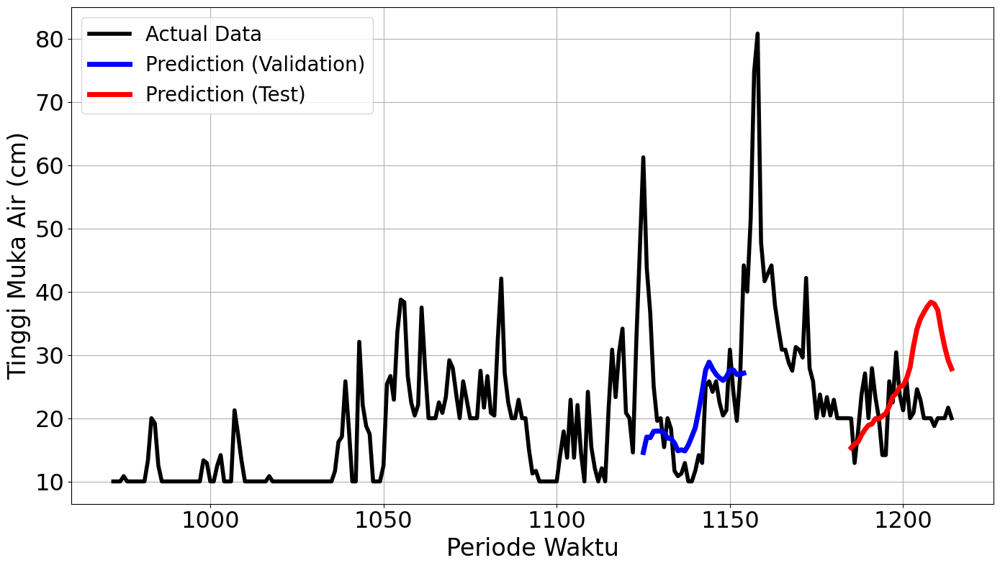

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.3337
Final Average MAPE Test: 0.4914


In [10]:
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from sklearn.metrics import mean_squared_error
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt

# Parameter Sliding Window Cross Validation
window_size = 243
n_test = 60
n_train_and_val = window_size - n_test
n_train = n_train_and_val - 60
shift = 243
n_windows1 = 5
n_total = len(data_series)
look_back = 30
time_step = 30

import itertools

config_params = {
    "learning_rate" : [0.001, 0.005],
    "batch_size" : [1, 16, 64, 128],
    "neurons" : [50],
    "init_scheme": ['he_uniform', 'glorot_uniform']
}

average_mape_vals_by_param = []
average_mape_tests_by_param = []

for xs in itertools.product(*list(config_params.values())):
  current_param = dict()
  for i, key in enumerate(config_params.keys()):
    if key == "batch_size":
      bsize = xs[i]
    else:
      current_param[key] = xs[i]

  mape_vals = []
  mape_tests = []

  for i in range(n_windows1):
      start = i * shift
      end = start + window_size
      if end > n_total:
          print(f"Window {i+1} tidak dapat dibuat karena melebihi batas data.")
          break

      window_data = data_series[start:end] #sliding window
      train_and_val = window_data[:n_train_and_val]
      train = train_and_val[:n_train]
      val = train_and_val[n_train:]
      test = window_data[n_train_and_val:]

      try:

          train_generator = TimeseriesGenerator(train, train, length=look_back, batch_size=bsize)

          val_generator = TimeseriesGenerator(val, val, length=look_back, batch_size=bsize)

          test_generator = TimeseriesGenerator(test, test, length=look_back, batch_size=bsize)

          model = create_model(current_param['neurons'], current_param['learning_rate'])

          # model.compile(optimizer='adam', loss='mean_squared_error')

          model.fit(train_generator, epochs=150, validation_data=val_generator, callbacks=[EarlyStoppingAtMinLoss(patience=5)], verbose = 1)

          val_predictions = model.predict(val_generator)
          test_predictions  = model.predict(test_generator)

          val_predictions_descale = scaler.inverse_transform(val_predictions).flatten()
          test_predictions_descale = scaler.inverse_transform(test_predictions).flatten()

          train_actual = scaler.inverse_transform(train).flatten()
          val_actual = scaler.inverse_transform(val).flatten()
          test_actual = scaler.inverse_transform(test).flatten()

          all_actual = np.append(np.append(train_actual, val_actual), test_actual)

          val_true = val[look_back:]
          val_true_descale = scaler.inverse_transform(val_true).flatten()
          mape_val = mean_absolute_percentage_error(val_true_descale, val_predictions_descale)

          test_true = test[look_back:]
          test_true_descale = scaler.inverse_transform(test_true).flatten()
          mape_test = mean_absolute_percentage_error(test_true_descale, test_predictions_descale)

          mape_vals.append(mape_val)
          mape_tests.append(mape_test)

          print(f"mape validation = {mape_val * 100} %")
          print(f"mape test = {mape_test * 100} %")

          # X_actual = np.arange(0, len(train) + len(val) + len(test))
          # X_train = np.arange(0, len(train))
          # X_val = np.arange(len(train) + look_back, len(train) + len(val))
          # X_test = np.arange(len(train) + len(val) + look_back, len(train) + len(val) + len(test))
          start_idx = start
          X_actual = np.arange(start_idx, start_idx + len(train) + len(val) + len(test))
          X_val = np.arange(start_idx + len(train) + look_back, start_idx + len(train) + len(val))
          X_test = np.arange(start_idx + len(train) + len(val) + look_back, start_idx + len(train) + len(val) + len(test))
          # axs[i].plot(X_actual, all_actual, lw=2, color='black', label='actual data')
          # axs[i].plot(X_val, val_predictions_descale, lw=2.5, color='blue', label='prediction validation')
          # axs[i].plot(X_test, test_predictions_descale, lw=2.5, color='red', label='prediction test')
          # axs[i].set_title(f'Window {i+1}')
          # axs[i].legend(loc='upper left')  # legend untuk setiap subplot
          plt.figure(figsize=(14, 8))
          plt.plot(X_actual, all_actual, lw=4, color='black', label='Actual Data')
          plt.plot(X_val, val_predictions_descale, lw=5, color='blue', label='Prediction (Validation)')
          plt.plot(X_test, test_predictions_descale, lw=5, color='red', label='Prediction (Test)')
          # plt.title(f'Window {i+1}', fontsize=25)
          plt.xlabel('Periode Waktu', fontsize=24)
          plt.ylabel('Tinggi Muka Air (cm)', fontsize=24)
          plt.ylim(top=85)
          plt.tick_params(axis='both', labelsize=23)
          # plt.setp(ax.get_xticklabels(), rotation=0, ha='center')
          plt.legend(loc='upper left', fontsize=20)
          plt.grid(True)
          plt.tight_layout()
          plt.show()

      except Exception as e:
          print(f"Error pada Window {i+1}: {e}")
          continue

  # Setelah loop selesai semua
  plt.tight_layout(rect=[0, 0, 1, 0.97])
  plt.show()

  # Rata-rata MAPE akhir
  if mape_vals and mape_tests:
      final_mape_val = np.mean(mape_vals)
      final_mape_test = np.mean(mape_tests)
      print(f"\nFinal Average MAPE Validation: {final_mape_val:.4f}")
      print(f"Final Average MAPE Test: {final_mape_test:.4f}")
      average_mape_vals_by_param.append(final_mape_val)
      average_mape_tests_by_param.append(final_mape_test)

### Hyperparameter Summary (SWCV)

In [11]:
# 1. Buat semua kombinasi hyperparameter
parameter_combinations = list(itertools.product(*config_params.values()))

# 2. Buat DataFrame ringkasan dengan kolom nilai MAPE dan kombinasi param
hyperparameter_summary = pd.DataFrame({
    "mape_vals": average_mape_vals_by_param,
    "mape_tests": average_mape_tests_by_param,
    "param_combo": parameter_combinations  # Masukkan kombinasi ke kolom DataFrame
})

# 3. Urutkan berdasarkan mape_tests (terkecil ke terbesar)
hyperparameter_summary_sorted = hyperparameter_summary.sort_values(by="mape_tests").reset_index(drop=True)

# 4. Ubah param_combo (tuple) menjadi dict agar readable
hyperparameter_summary_sorted["param_dict"] = hyperparameter_summary_sorted["param_combo"].apply(
    lambda combo: {k: combo[i] for i, k in enumerate(config_params.keys())}
)

# 5. Tampilkan seluruh kombinasi dalam urutan performa terbaik
for i, row in hyperparameter_summary_sorted.iterrows():
    print(f"Rank {i+1}:")
    print(f"  MAPE (val):  {row['mape_vals']:.6f}")
    print(f"  MAPE (test): {row['mape_tests']:.6f}")
    print(f"  Params:      {row['param_dict']}")
    print("-" * 40)

Rank 1:
  MAPE (val):  0.187226
  MAPE (test): 0.204730
  Params:      {'learning_rate': 0.005, 'batch_size': 1, 'neurons': 50, 'init_scheme': 'glorot_uniform'}
----------------------------------------
Rank 2:
  MAPE (val):  0.187226
  MAPE (test): 0.204730
  Params:      {'learning_rate': 0.005, 'batch_size': 1, 'neurons': 50, 'init_scheme': 'he_uniform'}
----------------------------------------
Rank 3:
  MAPE (val):  0.281012
  MAPE (test): 0.230877
  Params:      {'learning_rate': 0.005, 'batch_size': 64, 'neurons': 50, 'init_scheme': 'he_uniform'}
----------------------------------------
Rank 4:
  MAPE (val):  0.281012
  MAPE (test): 0.230877
  Params:      {'learning_rate': 0.005, 'batch_size': 64, 'neurons': 50, 'init_scheme': 'glorot_uniform'}
----------------------------------------
Rank 5:
  MAPE (val):  0.244042
  MAPE (test): 0.423443
  Params:      {'learning_rate': 0.005, 'batch_size': 16, 'neurons': 50, 'init_scheme': 'he_uniform'}
----------------------------------------

### Best Parameter (SWCV)

In [12]:
best_param = {'learning_rate': 0.005, 'batch_size': 1, 'neurons': 50, 'init_scheme': 'glorot_uniform'}

In [13]:
def create_model(neurons, learning_rate, init_scheme='glorot_uniform'):
    seed = 42
    np.random.seed(seed)
    tf.random.set_seed(seed)
    random.seed(seed)

    model = Sequential()
    model.add(LSTM(
        neurons,
        activation='tanh',
        kernel_initializer=init_scheme,
        input_shape=(time_step, 1)
    ))
    model.add(Dropout(0.01))
    model.add(Dense(1))

    optimizer = Adam(learning_rate=learning_rate)
    model.compile(loss='mean_squared_error', optimizer=optimizer)
    return model

In [18]:
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import numpy as np

data = pd.read_csv('https://raw.githubusercontent.com/Mluthfialgifari/Tugas-Akhir-Skripsi/refs/heads/main/Data/Data%20TMA%20(Jan%202022%20-%20Mei%202025).csv')
data = data.loc[:, ['Daily_Period', 'TMA_Daily']]
data = data.iloc[972:1215].reset_index(drop=True)

train_data = data.iloc[:123]
val_data = data.iloc[123:183]
test_data = data.iloc[183:]

# Mengambil kolom 'TMA_Daily' sebagai data yang akan diprediksi
time_series_data = data['TMA_Daily'].values.reshape(-1, 1)

# Normalisasi data ke rentang 0-1
scaler = MinMaxScaler()
time_series_data = scaler.fit_transform(time_series_data)

# Menentukan ukuran dataset
train_size = 123
val_size = 60
test_size = len(time_series_data) - train_size - val_size

# Membagi data menjadi train, val, test
train_data = time_series_data[:train_size]
val_data = time_series_data[train_size:train_size+val_size]
test_data = time_series_data[train_size+val_size:]

# Fungsi untuk membuat dataset dengan sekuens deret waktu
def create_sequences(data, seq_length):
    sequences = []
    for i in range(len(data) - seq_length):
        sequences.append(data[i : i + seq_length])
    return np.array(sequences)

# Panjang sekuens deret waktu
seq_length = 30

# Membuat dataset sekuens
X_train = create_sequences(train_data, seq_length)
X_val = create_sequences(val_data, seq_length)
X_test = create_sequences(test_data, seq_length)

# Memisahkan fitur dan target
y_train = X_train[:, -1]
X_train = X_train[:, :-1]

y_val = X_val[:, -1]
X_val = X_val[:, :-1]

y_test = X_test[:, -1]
X_test = X_test[:, :-1]

# Reshape untuk input LSTM (samples, time steps, features)
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_val = X_val.reshape(X_val.shape[0], X_val.shape[1], 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)

model = create_model(best_param['neurons'],
                     best_param['learning_rate'],
                     best_param.get('init_scheme', 'glorot_uniform')
)
history = model.fit(
    X_train, y_train,
    epochs=40,
    batch_size=1,
    validation_data=(X_val, y_val),
    verbose=10)

Epoch 1/40


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 2/40
Epoch 3/40
Epoch 4/40
Epoch 5/40
Epoch 6/40
Epoch 7/40
Epoch 8/40
Epoch 9/40
Epoch 10/40
Epoch 11/40
Epoch 12/40
Epoch 13/40
Epoch 14/40
Epoch 15/40
Epoch 16/40
Epoch 17/40
Epoch 18/40
Epoch 19/40
Epoch 20/40
Epoch 21/40
Epoch 22/40
Epoch 23/40
Epoch 24/40
Epoch 25/40
Epoch 26/40
Epoch 27/40
Epoch 28/40
Epoch 29/40
Epoch 30/40
Epoch 31/40
Epoch 32/40
Epoch 33/40
Epoch 34/40
Epoch 35/40
Epoch 36/40
Epoch 37/40
Epoch 38/40
Epoch 39/40
Epoch 40/40


### Plot Model Loss

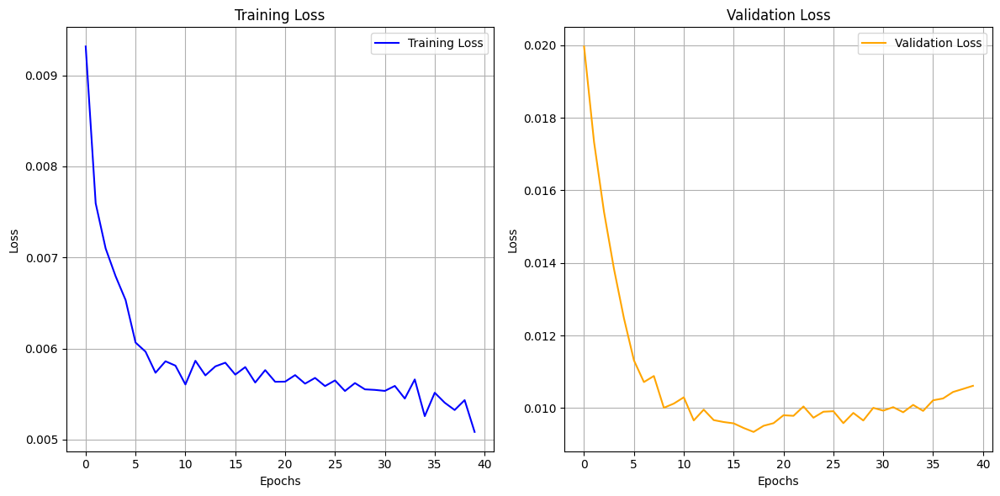

In [19]:
import matplotlib.pyplot as plt

# Membuat subplot 1 baris 2 kolom
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Subplot kiri: Training Loss
axs[0].plot(history.history['loss'], label='Training Loss', color='blue')
axs[0].set_title('Training Loss')
axs[0].set_xlabel('Epochs')
axs[0].set_ylabel('Loss')
axs[0].grid(True)
axs[0].legend()

# Subplot kanan: Validation Loss
axs[1].plot(history.history['val_loss'], label='Validation Loss', color='orange')
axs[1].set_title('Validation Loss')
axs[1].set_xlabel('Epochs')
axs[1].set_ylabel('Loss')
axs[1].grid(True)
axs[1].legend()

# Tata letak rapat
plt.tight_layout()
plt.show()

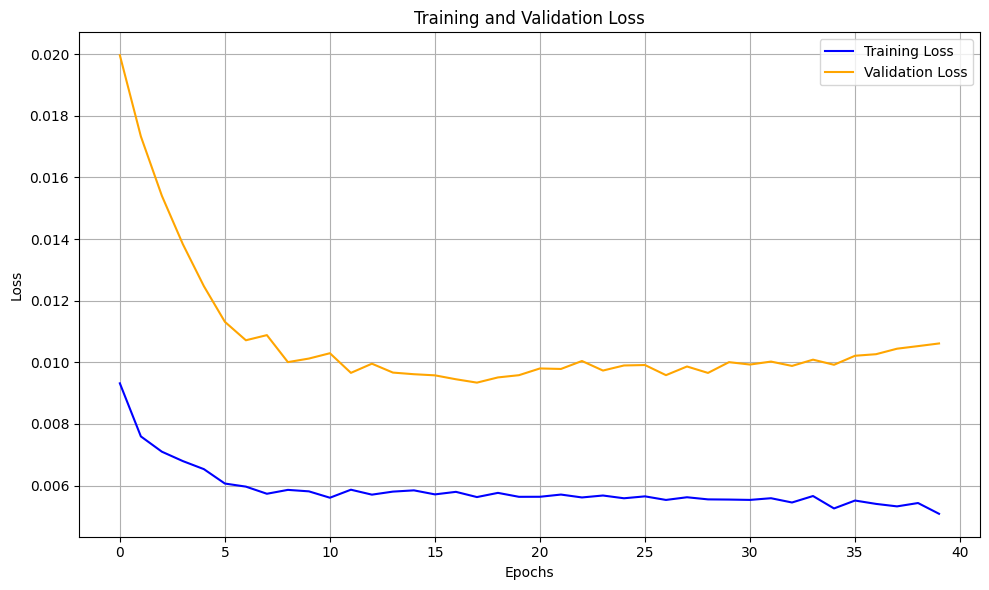

In [20]:
import matplotlib.pyplot as plt

# Membuat plot gabungan training dan validation loss
plt.figure(figsize=(10, 6))

plt.plot(history.history['loss'], label='Training Loss', color='blue')
plt.plot(history.history['val_loss'], label='Validation Loss', color='orange')

plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()

### MAPE Train

In [21]:
def inverse_transform(scaler, input):
  return input * (scaler.data_max_[0] - scaler.data_min_[0]) + scaler.data_min_[0]

# inverse_transform(scaler, predicted)

In [22]:
train_predict = model.predict(X_train).flatten()
train_predict_denorm = inverse_transform(scaler, train_predict)
y_train_denorm = inverse_transform(scaler, y_train)
mape_train = mean_absolute_percentage_error(y_train_denorm, train_predict_denorm)
mape_train

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


0.21728677934630353

### Plot Train Actual vs Predicted

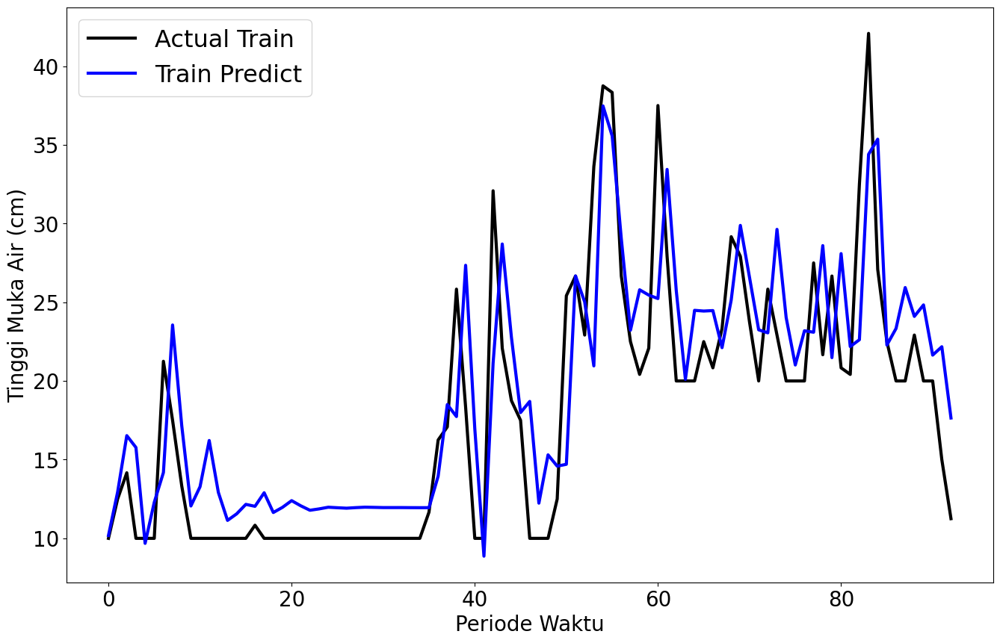

In [23]:
# Plot perbandingan actual train dan train predict

plt.figure(figsize=(16, 10))

plt.plot(y_train_denorm, lw=3, label='Actual Train', color = 'black')
plt.plot(train_predict_denorm, lw=3, label='Train Predict', color = 'blue')
# plt.title('Perbandingan Actual Train dan Train Predict')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('Periode Waktu', fontsize=20)
plt.ylabel('Tinggi Muka Air (cm)', fontsize=20)
plt.legend(loc = 'upper left', fontsize = 23)
plt.show()